a. Directory Structure (notebooks for testing and src once build complete)

project/
│
├── notebooks/
│   ├── animate_main.py
│   ├── animate/
│       ├── __init__.py
│       ├── viewpoints.py
│       ├── court.py
│       ├── elements.py
│       ├── animation.py
│       └── angle_meter.py
│
├── src/
│   ├── animate/
│       ├── __init__.py
│       ├── viewpoints.py
│       ├── court.py
│       ├── elements.py
│       ├── animation.py
│       └── angle_meter.py
│
├── data/
│   └── processed/
│       └── final_granular_dataset.csv






In [10]:
%%writefile animate/__init__.py
# Create __init__.py in notebooks/animate/
# Empty file to mark 'animate' as a package


Overwriting animate/__init__.py


In [11]:
%%writefile animate/viewpoints.py
import logging
import pandas as pd
import numpy as np

logger = logging.getLogger(__name__)

# Define common viewpoints
COMMON_VIEWPOINTS = {
    "side_view_right": {"elev": 0, "azim": 90},
    "side_view_left": {"elev": 0, "azim": -90},
    "top_down": {"elev": 90, "azim": 0},
    "diagonal_view": {"elev": 45, "azim": 45},
    "player_centric": {"elev": 30, "azim": 0},
    "diagonal_player_centric": {"elev": 30, "azim": 45},
    "inverse_player_centric": {"elev": 30, "azim": 180}
}

def get_viewpoint(name: str) -> dict:
    """
    Retrieve viewpoint parameters by name.
    
    Parameters:
    - name (str): The name of the viewpoint.
    
    Returns:
    - dict: Dictionary containing 'elev' and 'azim'.
    """
    try:
        viewpoint = COMMON_VIEWPOINTS[name]
        logger.debug(f"Retrieved viewpoint '{name}': {viewpoint}")
        return viewpoint
    except KeyError:
        logger.error(f"Viewpoint '{name}' not found. Available viewpoints: {list(COMMON_VIEWPOINTS.keys())}")
        raise ValueError(f"Viewpoint '{name}' not found. Choose from {list(COMMON_VIEWPOINTS.keys())}")


Overwriting animate/viewpoints.py


In [12]:
%%writefile animate/court.py
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplbasketball.court3d import Court3D, draw_court_3d

logger = logging.getLogger(__name__)

def get_hoop_position(court_type: str = "nba", units: str = "ft", debug: bool = False) -> (float, float, float):
    """
    Calculate the 3D position of the basketball hoop based on court specifications.

    Parameters:
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - x, y, z (float): Coordinates of the hoop in 3D space.
    """
    try:
        court = Court3D(court_type=court_type, units=units)
        params = court.court_parameters
        # The hoop is located a certain distance from the edge of the court
        x = params['court_dims'][0] / 2 - params['hoop_distance_from_edge']
        y = 0.0  # Centered along the y-axis
        z = params['hoop_height']
        if debug:
            logger.debug(f"Calculated hoop position at (x={x}, y={y}, z={z}) for court type '{court_type}' in '{units}' units.")
        return x, y, z
    except KeyError as e:
        logger.error(f"Key error when accessing court parameters: {e}")
        raise
    except Exception as e:
        logger.error(f"Unexpected error in get_hoop_position: {e}")
        raise


def draw_court(ax: plt.Axes, court_type: str = "nba", units: str = "ft", debug: bool = False) -> None:
    """
    Draw the basketball court and hoops on the given axes.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        # Draw the court using mplbasketball
        draw_court_3d(ax, court_type=court_type, units=units, origin=np.array([0.0, 0.0]), line_width=2)
        if debug:
            logger.debug("Court drawn successfully using mplbasketball.")

        # Get court parameters
        court = Court3D(court_type=court_type, units=units)
        court_params = court.court_parameters
        if debug:
            logger.debug(f"Court Parameters in draw_court: {court_params}")

        # Get hoop position
        hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)


        # Draw the hoop as a circle
        hoop_radius = court_params['hoop_diameter'] / 2
        theta_circle = np.linspace(0, 2 * np.pi, 100)
        hoop_xs = hoop_x + hoop_radius * np.cos(theta_circle)
        hoop_ys = hoop_y + hoop_radius * np.sin(theta_circle)
        hoop_zs = np.full_like(hoop_xs, hoop_z)

        ax.plot(hoop_xs, hoop_ys, hoop_zs, c='orange', lw=3)
        if debug:
            logger.debug(f"Hoop drawn at position ({hoop_x}, {hoop_y}, {hoop_z}) with radius {hoop_radius}.")

        # Plot half-court line
        half_court_x = np.linspace(-court_params['court_dims'][0]/2, court_params['court_dims'][0]/2, 100)
        half_court_y = np.full_like(half_court_x, 0.0)
        half_court_z = np.full_like(half_court_x, 0.0)
        ax.plot(half_court_x, half_court_y, half_court_z, c='black', lw=2, linestyle='--', label='Half-Court Line')
        if debug:
            logger.debug("Half-court line plotted.")

        # Plot sidelines
        sideline_x = np.linspace(-court_params['court_dims'][0]/2, court_params['court_dims'][0]/2, 100)
        sideline_y_positive = np.full_like(sideline_x, court_params['court_dims'][1]/2)
        sideline_z = np.full_like(sideline_x, 0.0)
        ax.plot(sideline_x, sideline_y_positive, sideline_z, c='blue', lw=2, label='Sideline')
        if debug:
            logger.debug("Positive sideline plotted.")

        sideline_y_negative = np.full_like(sideline_x, -court_params['court_dims'][1]/2)
        ax.plot(sideline_x, sideline_y_negative, sideline_z, c='blue', lw=2, label='Sideline')
        if debug:
            logger.debug("Negative sideline plotted.")

        # Plot baselines
        baseline_y = np.linspace(-court_params['court_dims'][1]/2, court_params['court_dims'][1]/2, 100)
        baseline_z = np.full_like(baseline_y, 0.0)
        ax.plot(court_params['court_dims'][0]/2, baseline_y, baseline_z, c='green', lw=2, label='Baseline')
        if debug:
            logger.debug("Positive baseline plotted.")

        ax.plot(-court_params['court_dims'][0]/2, baseline_y, baseline_z, c='green', lw=2, label='Baseline')
        if debug:
            logger.debug("Negative baseline plotted.")

        if debug:
            logger.debug("Additional court features (half-court, sidelines, baselines) drawn successfully.")
    except KeyError as e:
        logger.error(f"Key error in draw_court: {e}")
        raise
    except Exception as e:
        logger.error(f"Error drawing court or hoop: {e}")
        raise


Overwriting animate/court.py


In [13]:
%%writefile animate/elements.py
import logging
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
import numpy as np

logger = logging.getLogger(__name__)

def initialize_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.

    Returns:
    - lines (dict): Dictionary of line objects for each connection.
    - ball (plt.Line2D): The ball plot object.
    - release_text (plt.Text): Text object for release point indicator.
    - motion_text (plt.Text): Text object for motion phase indicator.
    - distance_text (plt.Text): Text object for distance to hoop.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def initialize_plot(zlim=20, elev=30, azim=60, figsize=(12, 10), debug=False):
    """
    Initialize a 3D plot with specified view settings and outputs setup details.

    Parameters:
    - zlim (float): The limit for the z-axis (height).
    - elev (float): Elevation angle in the z plane for the camera view.
    - azim (float): Azimuth angle in the x,y plane for the camera view.
    - figsize (tuple): Figure size.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - fig: The Matplotlib figure object.
    - ax: The Matplotlib 3D axis object.
    """
    try:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection="3d")
        ax.set_zlim([0, zlim])
        ax.set_box_aspect([1, 1, 1])
        ax.view_init(elev=elev, azim=azim)
        ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        if debug:
            logger.debug(f"Initialized 3D plot with Z limit: {zlim}, Elevation: {elev}, Azimuth: {azim}")
        return fig, ax
    except Exception as e:
        logger.error(f"Failed to initialize plot: {e}")
        raise



Overwriting animate/elements.py


In [14]:
%%writefile animate/animate_from_df.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from IPython.display import HTML
from mplbasketball.court3d import Court3D, draw_court_3d

from animate.elements import initialize_elements, initialize_plot
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint


logger = logging.getLogger(__name__)

def update_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - frame (int): The current frame number.
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - lines (dict): Dictionary of line objects for skeleton.
    - ball (plt.Line2D): Ball object for animation.
    - release_text (plt.Text): Text object for release point.
    - motion_text (plt.Text): Text object for motion phase.
    - connections (list): Joint connections.
    - ball_color (str): Default ball color.
    - highlight_color (str): Highlight color for release point.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise



def animate_trial_from_df(
    df: pd.DataFrame,
    release_frame: int,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False
) -> HTML:
    """
    Animate a basketball trial from a DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - viewpoint_name (str): Name of the predefined viewpoint.
    - connections (list): List of joint connections.
    - zlim (float): The limit for the z-axis (height).
    - player_color (str): Color for player skeleton.
    - player_lw (float): Line width for player skeleton.
    - ball_color (str): Color for the ball.
    - ball_size (float): Size of the ball marker.
    - highlight_color (str): Highlight color for release point.
    - show_court (bool): Whether to display the court.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - notebook_mode (bool): Whether to display animation in Jupyter notebook.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - HTML: HTML representation of the animation for notebook display.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        # Close any existing figures to prevent duplicate animations
        plt.close('all')

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")

        # Retrieve elev and azim based on viewpoint_name
        viewpoint = get_viewpoint(viewpoint_name)
        elev = viewpoint['elev']
        azim = viewpoint['azim']

        # Plot setup with predefined viewpoint
        fig, ax = initialize_plot(zlim=zlim, elev=elev, azim=azim, figsize=(12, 10), debug=debug)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_elements(
            ax, connections, player_color, player_lw, ball_color, ball_size, debug=debug
        )

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax.set_xlim([x_min, x_max])
        ax.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name
        ax.set_title(f"Animation - {viewpoint_name}", fontsize=16)
        if debug:
            logger.debug(f"Set plot title to 'Animation - {viewpoint_name}'")

        # Create custom legend handles for static court features
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # Create handles for dynamic elements
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # Add legend with both static and dynamic elements (excluding distance)
        ax.legend(handles=[
            hoop_handle,  # Hoop in orange
            sideline_handle,  # Sideline in green
            baseline_handle,  # Baseline in blue
            player_handle,  # Player skeleton in purple
            ball_handle  # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # Update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            update_frame(
                ax=ax,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update the distance text if available
            if 'distance_to_hoop' in df.columns:
                distance = df.at[frame, 'distance_to_hoop']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Hoop: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Animation setup
        anim = FuncAnimation(fig, update_func, frames=len(df), interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim
    except Exception as e:
        logger.error(f"An error occurred during animation: {e}")
        raise






Overwriting animate/animate_from_df.py


In [15]:
%%writefile animate/animate_from_df_main.py

import logging
import pandas as pd
from IPython.display import display

from animate.animate_from_df import animate_trial_from_df

joint_configs = [
    {
        'name': 'knee',
        'min_angle_key': 'max_knee_angle_filtered_optimal_min',
        'max_angle_key': 'max_knee_angle_filtered_optimal_max',
        'release_min_angle_key': 'release_knee_angle_filtered_optimal_min',
        'release_max_angle_key': 'release_knee_angle_filtered_optimal_max',
        'angle_key': 'knee_angle',
        'is_max_key': 'is_max_knee_angle',
        'classification_key': 'max_knee_shot_classification',
        'release_classification_key': 'release_knee_shot_classification'
    },
    {
        'name': 'elbow',
        'min_angle_key': 'max_elbow_angle_filtered_optimal_min',
        'max_angle_key': 'max_elbow_angle_filtered_optimal_max',
        'release_min_angle_key': 'release_elbow_angle_filtered_optimal_min',
        'release_max_angle_key': 'release_elbow_angle_filtered_optimal_max',
        'angle_key': 'elbow_angle',
        'is_max_key': 'is_max_elbow_angle',
        'classification_key': 'max_elbow_shot_classification',
        'release_classification_key': 'release_elbow_shot_classification'
    },
    {
        'name': 'wrist',
        'min_angle_key': 'max_wrist_angle_filtered_optimal_min',
        'max_angle_key': 'max_wrist_angle_filtered_optimal_max',
        'release_min_angle_key': 'release_wrist_angle_filtered_optimal_min',
        'release_max_angle_key': 'release_wrist_angle_filtered_optimal_max',
        'angle_key': 'wrist_angle',
        'is_max_key': 'is_max_wrist_angle',
        'classification_key': 'max_wrist_shot_classification',
        'release_classification_key': 'release_wrist_shot_classification'
    }
]


# Configure logging for debugging
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def main():
    try:
        # Load data from the specified CSV file
        data_path = "../../data/processed/final_granular_dataset.csv"
        final_granular_df_with_stats = pd.read_csv(data_path)
        logger.debug(f"Loaded data from {data_path} with shape {final_granular_df_with_stats.shape}")

        # Define connections between joints
        connections = [
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ]
        logger.debug("Defined joint connections for player skeleton.")

        # Select a specific trial for visualization
        trial_id_to_visualize = 'T0088'  # Replace with actual trial ID you want to visualize
        trial_data = final_granular_df_with_stats[final_granular_df_with_stats['trial_id'] == trial_id_to_visualize]
        trial_data = trial_data.sort_values(by='frame_time').reset_index(drop=True)
        logger.debug(f"Selected trial ID '{trial_id_to_visualize}' with {len(trial_data)} frames.")

        # Determine the release frame (the frame where release_point_filter is 1)
        release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
        release_frame = release_frames[0] if release_frames else None
        if release_frame is not None:
            logger.debug(f"Release frame found at index {release_frame}.")
        else:
            logger.warning("No release frame found in the trial data.")

        # Set parameters for visualization
        viewpoint_name = "diagonal_player_centric"  # Choose from COMMON_VIEWPOINTS
        zlim = 15        # Adjust for height


        # Call the first animation function
        animation_html = animate_trial_from_df(
            df=trial_data,
            release_frame=release_frame,
            viewpoint_name=viewpoint_name,
            connections=connections,
            zlim=zlim,
            player_color="purple",
            player_lw=2.0,
            ball_color="#ee6730",
            ball_size=20.0,
            highlight_color="red",
            show_court=True,
            court_type="nba",
            units="ft",
            notebook_mode=True,
            debug=True  # Enable detailed logging for troubleshooting
        )
        
        # Display the first animation
        display(animation_html)

    except Exception as e:
        logger.error(f"An error occurred in main: {e}")
        raise

if __name__ == "__main__":
    main()


Overwriting animate/animate_from_df_main.py


### Add on Shot meters

- Basic logistic
  - No predictions needed
  - Take out the outliers and base it within the successful shots angles


- Bayes optimized angles with Shap post recommendations, graphs, and trends

In [16]:
#%%writefile ../../src/freethrow_predictions/ml/basic_shot_meter_feature_engineering.py
import pandas as pd
import numpy as np

def calculate_release_angles(df):
    # Filter for release points
    release_df = df[df['release_point_filter'] == 1]

    # Calculate release angles for knee, wrist, and elbow
    release_angles = release_df.groupby('trial_id').agg({
        'knee_angle': 'mean',
        'wrist_angle': 'mean',
        'elbow_angle': 'mean'
    }).rename(columns={
        'knee_angle': 'release_knee_angle',
        'wrist_angle': 'release_wrist_angle',
        'elbow_angle': 'release_elbow_angle'
    })

    # Merge release angles back onto the original DataFrame
    df = df.merge(release_angles, on='trial_id', how='left')

    return df
    
    
    

def calculate_optimal_release_angle_ranges(df, debug=False, lower_percentile=10, upper_percentile=90):
    """
    Calculate the initial and filtered optimal min and max ranges for knee, wrist, and elbow angles at the release point.
    Adds the calculated ranges as columns to every row in the DataFrame, and classifies shot quality for each joint.

    Parameters:
    - df: DataFrame containing the angle data with 'release_point_filter' column set to 1 for relevant rows.
    - debug: If True, prints detailed outputs at each step.
    - lower_percentile: The lower percentile threshold for filtering outliers (default is 10).
    - upper_percentile: The upper percentile threshold for filtering outliers (default is 90).

    Returns:
    - df: Updated DataFrame with optimal angle range columns and classifications added to every row.
    """
    # Filter the DataFrame for rows where release_point_filter == 1 and result == 1 (successful shots)
    release_df = df[(df['release_point_filter'] == 1) & (df['result'] == 1)]
    
    # Initialize the new columns to NaN in the main DataFrame
    for col in ['release_knee_angle_initial_optimal_min', 'release_knee_angle_initial_optimal_max',
                'release_knee_angle_filtered_optimal_min', 'release_knee_angle_filtered_optimal_max',
                'release_wrist_angle_initial_optimal_min', 'release_wrist_angle_initial_optimal_max',
                'release_wrist_angle_filtered_optimal_min', 'release_wrist_angle_filtered_optimal_max',
                'release_elbow_angle_initial_optimal_min', 'release_elbow_angle_initial_optimal_max',
                'release_elbow_angle_filtered_optimal_min', 'release_elbow_angle_filtered_optimal_max']:
        df[col] = float('nan')
    
    if not release_df.empty:
        # Calculate initial min and max values (before removing outliers)
        initial_ranges = {
            'release_knee_angle_initial_optimal_min': release_df['knee_angle'].min(),
            'release_knee_angle_initial_optimal_max': release_df['knee_angle'].max(),
            'release_wrist_angle_initial_optimal_min': release_df['wrist_angle'].min(),
            'release_wrist_angle_initial_optimal_max': release_df['wrist_angle'].max(),
            'release_elbow_angle_initial_optimal_min': release_df['elbow_angle'].min(),
            'release_elbow_angle_initial_optimal_max': release_df['elbow_angle'].max()
        }
        
        if debug:
            print("Initial Angle Ranges (Before Removing Outliers):")
            for key, value in initial_ranges.items():
                print(f"- {key}: {value:.2f}°")
        
        # Calculate the specified percentiles for each angle
        knee_angle_lower = release_df['knee_angle'].quantile(lower_percentile / 100.0)
        knee_angle_upper = release_df['knee_angle'].quantile(upper_percentile / 100.0)
        wrist_angle_lower = release_df['wrist_angle'].quantile(lower_percentile / 100.0)
        wrist_angle_upper = release_df['wrist_angle'].quantile(upper_percentile / 100.0)
        elbow_angle_lower = release_df['elbow_angle'].quantile(lower_percentile / 100.0)
        elbow_angle_upper = release_df['elbow_angle'].quantile(upper_percentile / 100.0)
        
        # Filter out outliers based on the specified percentile range for each angle
        filtered_release_df = release_df[
            (release_df['knee_angle'] >= knee_angle_lower) & (release_df['knee_angle'] <= knee_angle_upper) &
            (release_df['wrist_angle'] >= wrist_angle_lower) & (release_df['wrist_angle'] <= wrist_angle_upper) &
            (release_df['elbow_angle'] >= elbow_angle_lower) & (release_df['elbow_angle'] <= elbow_angle_upper)
        ]
        
        # Calculate min and max values after filtering
        filtered_ranges = {
            'release_knee_angle_filtered_optimal_min': filtered_release_df['knee_angle'].min(),
            'release_knee_angle_filtered_optimal_max': filtered_release_df['knee_angle'].max(),
            'release_wrist_angle_filtered_optimal_min': filtered_release_df['wrist_angle'].min(),
            'release_wrist_angle_filtered_optimal_max': filtered_release_df['wrist_angle'].max(),
            'release_elbow_angle_filtered_optimal_min': filtered_release_df['elbow_angle'].min(),
            'release_elbow_angle_filtered_optimal_max': filtered_release_df['elbow_angle'].max()
        }
        
        if debug:
            print(f"\nFiltered Angle Ranges (After Removing {lower_percentile}th and {upper_percentile}th Percentile Outliers):")
            for key, value in filtered_ranges.items():
                print(f"- {key}: {value:.2f}°")

        # Assign these values to all rows in the main DataFrame
        for key, value in {**initial_ranges, **filtered_ranges}.items():
            df[key] = value
        
        # Step 6: Add classification for each joint
        def classify_joint(angle_value, min_val, max_val):
            if angle_value < min_val:
                return "Early"
            elif angle_value > max_val:
                return "Late"
            else:
                return "Good"
        
        # Apply classification to merged_df
        df['release_wrist_shot_classification'] = df.apply(
            lambda row: classify_joint(row['wrist_angle'], filtered_ranges['release_wrist_angle_filtered_optimal_min'], filtered_ranges['release_wrist_angle_filtered_optimal_max']),
            axis=1
        )
        df['release_elbow_shot_classification'] = df.apply(
            lambda row: classify_joint(row['elbow_angle'], filtered_ranges['release_elbow_angle_filtered_optimal_min'], filtered_ranges['release_elbow_angle_filtered_optimal_max']),
            axis=1
        )
        df['release_knee_shot_classification'] = df.apply(
            lambda row: classify_joint(row['knee_angle'], filtered_ranges['release_knee_angle_filtered_optimal_min'], filtered_ranges['release_knee_angle_filtered_optimal_max']),
            axis=1
        )
        
        if debug:
            print("\nShot Classifications Added:")
            print(df[['trial_id', 'release_wrist_shot_classification', 'release_elbow_shot_classification'
                      , 'release_knee_shot_classification'
                      , 'release_knee_angle_filtered_optimal_min', 'release_knee_angle_filtered_optimal_max'
                      , 'release_elbow_angle_filtered_optimal_min', 'release_elbow_angle_filtered_optimal_max'
                      , 'release_wrist_angle_filtered_optimal_min', 'release_wrist_angle_filtered_optimal_max']].head())
        
    else:
        if debug:
            print("No rows found where release_point_filter is set to 1.")
    
    return df



def calculate_optimal_max_angle_ranges(final_granular_df, output_path, debug=False, lower_percentile=10, upper_percentile=90):
    """
    Calculates min and max wrist, elbow, and knee angles from successful shots during shooting motion,
    while applying a filter to remove outliers based on specified percentiles. The function then
    adds these statistics as new columns to `final_granular_df`, classifies each joint's shot as Early, Good, or Late,
    and adds binary columns marking the maximum angle point for each joint.
    
    Args:
        final_granular_df (pd.DataFrame): The input DataFrame with shot data.
        debug (bool): Whether to print debug information for each processing step.
        lower_percentile (int): Lower percentile for outlier removal.
        upper_percentile (int): Upper percentile for outlier removal.
    
    Returns:
        pd.DataFrame: `final_granular_df` with additional columns for min and max values of each angle,
                      separate shot classifications for each joint, and binary indicators for maximum angle points.
    """
    
    # Initial debug: DataFrame structure and size
    if debug:
        print("Initial DataFrame length:", len(final_granular_df))
        print("Columns in final_granular_df:\n", final_granular_df.columns)
        total_trials_before_filter = final_granular_df['trial_id'].nunique()
        print(f"\nTotal number of trials before filtering by `result`: {total_trials_before_filter}")
    
    # Step 1: Filter for active shooting motion
    motion_df = final_granular_df[final_granular_df['shooting_motion'] == 1]
    if debug:
        print("\nFiltered DataFrame for rows where shooting motion is active:")
        print("Number of rows after filtering by shooting motion:", len(motion_df))
    
    # Step 2: Calculate max angles per trial for wrist, elbow, and knee
    max_angles_per_trial = motion_df.groupby('trial_id').agg({
        'wrist_angle': 'max',
        'elbow_angle': 'max',
        'knee_angle': 'max'
    }).reset_index()
    
    if debug:
        print("\nCalculated maximum angles per trial during shooting motion:")
        print(max_angles_per_trial.head())
    
    # Step 3: Merge max angles with motion_df to mark the max points
    merged_df = motion_df.merge(
        max_angles_per_trial.rename(columns={
            'wrist_angle': 'max_wrist_angle',
            'elbow_angle': 'max_elbow_angle',
            'knee_angle': 'max_knee_angle'
        }),
        on='trial_id', how='left'
    )
    
    # Create binary indicators for the max angle points
    merged_df['is_max_wrist_angle'] = ((merged_df['wrist_angle'] == merged_df['max_wrist_angle'])).astype(int)
    merged_df['is_max_elbow_angle'] = ((merged_df['elbow_angle'] == merged_df['max_elbow_angle'])).astype(int)
    merged_df['is_max_knee_angle'] = ((merged_df['knee_angle'] == merged_df['max_knee_angle'])).astype(int)
    
    
    # Step 4: Filter for successful shots
    successful_shots_df = merged_df[merged_df['result'] == 1]
    if debug:
        print("\nFiltered DataFrame for successful shots (result=1):")
        print("Number of rows after filtering by `result`:", len(successful_shots_df))
        total_trials_after_result_filter = successful_shots_df['trial_id'].nunique()
        print(f"Total number of trials after filtering by `result`: {total_trials_after_result_filter}")
    
    # Step 5: Calculate initial and filtered stats
    stats = {}
    for angle in ['max_wrist_angle', 'max_elbow_angle', 'max_knee_angle']:
        # Define percentiles for filtering
        lower_bound = np.percentile(successful_shots_df[angle], lower_percentile)
        upper_bound = np.percentile(successful_shots_df[angle], upper_percentile)
    
        # Store filtered min and max in stats
        stats[f"{angle}_initial_optimal_min"] = successful_shots_df[angle].min()
        stats[f"{angle}_initial_optimal_max"] = successful_shots_df[angle].max()
        
        # Filter outliers
        filtered_data = successful_shots_df[(successful_shots_df[angle] >= lower_bound) &
                                            (successful_shots_df[angle] <= upper_bound)]
        
        # Store filtered min and max in stats
        stats[f"{angle}_filtered_optimal_min"] = filtered_data[angle].min()
        stats[f"{angle}_filtered_optimal_max"] = filtered_data[angle].max()
    
    if debug:
        print("\nOptimal knee/wrist/elbow angles filtered by the percentile range:")
        print(stats)
        
    for key, value in stats.items():
        merged_df[key] = value
        
    if debug:
        print("\nOptimal knee/wrist/elbow angles added to the merged df:")
        print(merged_df.columns)
        
    # Step 6: Add classification for each joint
    def classify_joint(angle_value, min_val, max_val):
        if angle_value < min_val:
            return "Early"
        elif angle_value > max_val:
            return "Late"
        else:
            return "Good"

    # Apply classification to merged_df
    merged_df['max_wrist_shot_classification'] = merged_df.apply(
        lambda row: classify_joint(row['wrist_angle'], stats['max_wrist_angle_filtered_optimal_min'], stats['max_wrist_angle_filtered_optimal_max']),
        axis=1
    )
    merged_df['max_elbow_shot_classification'] = merged_df.apply(
        lambda row: classify_joint(row['elbow_angle'], stats['max_elbow_angle_filtered_optimal_min'], stats['max_elbow_angle_filtered_optimal_max']),
        axis=1
    )
    merged_df['max_knee_shot_classification'] = merged_df.apply(
        lambda row: classify_joint(row['knee_angle'], stats['max_knee_angle_filtered_optimal_min'], stats['max_knee_angle_filtered_optimal_max']),
        axis=1
    )
    merged_df.to_csv(output_path, index=False)
    print(f"Updated dataset saved to {output_path}")
    
    if debug:
        print("\nSample rows with calculated shot classifications for each joint and max angle indicators:")
        print(merged_df[['trial_id', 'wrist_angle', 'elbow_angle', 'knee_angle', 'shooting_motion', 
                        'max_wrist_shot_classification', 'max_elbow_shot_classification', 'max_knee_shot_classification', 
                        'is_max_wrist_angle', 'is_max_elbow_angle', 'is_max_knee_angle', 
                        'max_elbow_angle_initial_optimal_max', 'max_elbow_angle_filtered_optimal_min',
                        'max_elbow_angle_filtered_optimal_max', 'max_knee_angle_initial_optimal_min',
                        'max_knee_angle_initial_optimal_max', 'max_knee_angle_filtered_optimal_min',
                        'max_knee_angle_filtered_optimal_max', 'release_knee_angle']].head())

    
    return merged_df

# Example usage in main block
if __name__ == "__main__":
    # Load data from the specified CSV file
    data_path = "../../data/processed/final_granular_dataset.csv"
    final_granular_df_with_stats = pd.read_csv(data_path)
    
    final_granular_df_release_angles = calculate_release_angles(final_granular_df_with_stats)
    # Example release angle usage
    final_granular_df_release_angles_ranges = calculate_optimal_release_angle_ranges(final_granular_df_release_angles, debug=True, lower_percentile=10, upper_percentile=90)

    # Assuming `final_granular_df` is predefined and loaded
    output_path = "../../data/model/shot_meter_docs/final_granular_logistic_optimized_meter_dataset.csv"  # Renamed for clarity
    final_granular_df_with_stats = calculate_optimal_max_angle_ranges(final_granular_df_release_angles_ranges, debug=True, lower_percentile=10, upper_percentile=90, output_path=output_path)


Initial Angle Ranges (Before Removing Outliers):
- release_knee_angle_initial_optimal_min: 21.98°
- release_knee_angle_initial_optimal_max: 37.08°
- release_wrist_angle_initial_optimal_min: 17.83°
- release_wrist_angle_initial_optimal_max: 37.44°
- release_elbow_angle_initial_optimal_min: 38.88°
- release_elbow_angle_initial_optimal_max: 80.65°

Filtered Angle Ranges (After Removing 10th and 90th Percentile Outliers):
- release_knee_angle_filtered_optimal_min: 26.53°
- release_knee_angle_filtered_optimal_max: 33.98°
- release_wrist_angle_filtered_optimal_min: 21.98°
- release_wrist_angle_filtered_optimal_max: 30.54°
- release_elbow_angle_filtered_optimal_min: 55.21°
- release_elbow_angle_filtered_optimal_max: 73.01°

Shot Classifications Added:
  trial_id release_wrist_shot_classification  \
0    T0001                              Good   
1    T0001                              Late   
2    T0001                              Late   
3    T0001                              Late   
4    

In [17]:
%%writefile animate/angle_meter.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

logger = logging.getLogger(__name__)

def update_release_angle_line(ax_meter, release_angle, release_knee_shot_classification, release_angle_text, debug=False):
    """Draw the release knee angle line and update the release angle text with classification."""
    release_angle_rad = release_angle * np.pi / 180  # Convert to radians for polar plot
    ax_meter.plot([0, release_angle_rad], [0, 1], color='black', lw=2, linestyle="-")

    # Update the release angle text with classification
    release_angle_text.set_text(f'Release Knee Angle: {release_angle:.1f}° ({release_knee_shot_classification})')
    release_angle_text.set_zorder(15)  # Ensure it stays on top

    if debug:
        print(f"Debug: Release angle line added at {release_angle}° with classification '{release_knee_shot_classification}'")



def update_angle_meter(
    ax_meter,
    df,
    frame,
    needle,
    angle_text,
    max_angle_text,
    release_angle_text,
    max_angle,
    classification,
    release_angle,
    release_classification,
    angle_key,
    is_max_key,
    classification_key,
    release_classification_key,
    debug
):
    """Generalized function to update the angle meter for any joint."""
    try:
        current_angle = df.loc[frame, angle_key] * np.pi / 180  # Convert to radians
        needle.set_data([0, current_angle], [0, 1])  # Update needle position
        angle_text.set_text(f'Ongoing Angle: {df.loc[frame, angle_key]:.1f}°')

        if debug:
            logger.debug(f"Frame {frame}, Current angle for '{angle_key}': {df.loc[frame, angle_key]:.1f}°")

        if df.loc[frame, is_max_key] == 1 and max_angle is None:
            max_angle = df.loc[frame, angle_key]
            if classification_key in df.columns:
                classification = df.loc[frame, classification_key]
            else:
                classification = 'N/A'
                logger.warning(f"Column '{classification_key}' missing for joint '{angle_key}'.")
            update_max_angle_line(ax_meter, max_angle, classification, max_angle_text, debug=debug)

        if df.loc[frame, 'release_point_filter'] == 1 and release_angle is None:
            release_angle = df.loc[frame, angle_key]
            if release_classification_key in df.columns:
                release_classification = df.loc[frame, release_classification_key]
            else:
                release_classification = 'N/A'
                logger.warning(f"Column '{release_classification_key}' missing for joint '{angle_key}'.")
            update_release_angle_line(ax_meter, release_angle, release_classification, release_angle_text, debug=debug)

        return max_angle, classification, release_angle, release_classification
    except KeyError as e:
        logger.error(f"Missing column during angle meter update: {e}")
        raise

def update_max_angle_line(ax_meter, max_angle, classification, max_angle_text, debug=False):
    """
    Draw the maximum angle line and display max angle with classification.
    Display format: Max Knee Angle: {max_knee_angle}° ({max_knee_shot_classification})
    """
    try:
        max_angle_rad = max_angle * np.pi / 180  # Convert to radians for polar plot
        ax_meter.plot([0, max_angle_rad], [0, 1], color='black', lw=2, linestyle="-")

        # Update the max angle text content with zorder to ensure visibility
        max_angle_text.set_text(f'Max Angle: {max_angle:.1f}° ({classification})')
        max_angle_text.set_zorder(15)  # Ensure it stays on top

        if debug:
            logger.debug(f"Max angle line added at {max_angle}° with classification '{classification}' positioned near center.")
    except Exception as e:
        logger.error(f"Error in update_max_angle_line: {e}")
        raise

def add_optimal_lines(ax, min_angle, max_angle, release_min_angle, release_max_angle, debug=False):
    """
    Add optimal min and max lines to the angle meter, including release min and max angles.
    """
    try:
        # Convert angles to radians
        min_angle_rad = min_angle * np.pi / 180
        max_angle_rad = max_angle * np.pi / 180
        release_min_angle_rad = release_min_angle * np.pi / 180
        release_max_angle_rad = release_max_angle * np.pi / 180

        # Plotting optimal min and max lines
        ax.plot([0, min_angle_rad], [0, 1], color='darkblue', lw=2, linestyle="--")
        ax.plot([0, max_angle_rad], [0, 1], color='darkblue', lw=2, linestyle="--")

        # Plotting release min and max lines in red
        ax.plot([0, release_min_angle_rad], [0, 1], color='red', lw=2, linestyle="--")
        ax.plot([0, release_max_angle_rad], [0, 1], color='red', lw=2, linestyle="--")

        if debug:
            logger.debug(f"Added optimal lines at {min_angle}° and {max_angle}°, release lines at {release_min_angle}° and {release_max_angle}°")
    except Exception as e:
        logger.error(f"Error in add_optimal_lines: {e}")
        raise

def create_angle_meter(
    fig,
    selected_joint,
    min_angle,
    max_angle,
    release_min_angle,
    release_max_angle,
    text_offsets,
    debug=False
):
    """
    Create an angle meter plot for the selected joint.

    Parameters:
    - fig (plt.Figure): The figure to add the meter to.
    - selected_joint (str): The joint to display ('knee', 'elbow', 'wrist').
    - min_angle (float): The minimum optimal angle.
    - max_angle (float): The maximum optimal angle.
    - release_min_angle (float): The minimum release angle.
    - release_max_angle (float): The maximum release angle.
    - text_offsets (dict): Dictionary containing text offsets for the selected joint.
    - debug (bool): Flag to print debug information.

    Returns:
    - tuple: (ax_meter, needle, angle_text, max_angle_text, release_angle_text)
    """
    try:
        # Set up angle meter as a polar subplot for half-circle (180 degrees)
        ax_meter = fig.add_subplot(122, polar=True)
        ax_meter.set_theta_offset(np.pi)  # Rotate to make it horizontal
        ax_meter.set_theta_direction(-1)  # Counter-clockwise

        # Define 180-degree range with ticks and labels
        angle_ticks = np.linspace(0, np.pi, 6)
        angle_labels = [f'{int(angle)}°' for angle in np.linspace(0, 180, 6)]
        ax_meter.set_xticks(angle_ticks)
        ax_meter.set_xticklabels(angle_labels)
        ax_meter.set_yticklabels([])  # Hide radial labels for clarity

        # Limit the radial display to the upper half
        ax_meter.set_ylim(0, 1)  # Only show radial values from 0 to 1

        # Hide the lower half of the plot by masking the unwanted area
        ax_meter.set_facecolor("white")  # Set facecolor to blend with background
        ax_meter.fill_between(np.linspace(np.pi, 2 * np.pi, 100), 0, 1, color="white", zorder=10)  # Cover bottom half

        # Remove the full circular outline and add a 180-degree dividing line
        ax_meter.spines['polar'].set_visible(False)  # Hide full circular outline
        ax_meter.plot([0, np.pi], [0, 1], color='black', lw=1)  # Add a line along 180 degrees

        # Add optimal lines including release min and max lines
        add_optimal_lines(ax_meter, min_angle, max_angle, release_min_angle, release_max_angle, debug=debug)

        # Initialize the needle and text placeholders with adjustable y-positions
        needle, = ax_meter.plot([], [], color='r', lw=2)
        max_angle_text = ax_meter.text(
            0.5, text_offsets['max_angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=14, color='black', zorder=15
        )
        angle_text = ax_meter.text(
            0.5, text_offsets['angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=16, zorder=15
        )
        release_angle_text = ax_meter.text(
            0.5, text_offsets['release_angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=14, color='black', zorder=15
        )

        if debug:
            logger.debug(f"Angle meter for '{selected_joint}' initialized with needle and angle text placeholders.")

        return ax_meter, needle, angle_text, max_angle_text, release_angle_text
    except Exception as e:
        logger.error(f"Error in create_angle_meter: {e}")
        raise


def initialize_angle_meter(
    fig: plt.Figure,
    df: pd.DataFrame,
    joint_config: dict,
    selected_joint: str,
    debug: bool = False
) -> dict:
    """
    Initialize the angle meter for the selected joint.

    Parameters:
    - fig (plt.Figure): The matplotlib figure object.
    - df (pd.DataFrame): DataFrame containing motion data.
    - joint_config (dict): Configuration dictionary for the joint.
    - selected_joint (str): The joint to display ('knee', 'elbow', 'wrist').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - dict: Dictionary containing angle meter components.
    """
    angle_meter_obj = {}
    try:
        if joint_config['name'].lower() != selected_joint.lower():
            # Skip initialization for non-selected joints
            return angle_meter_obj

        # Define text offsets based on joint
        if selected_joint.lower() == 'knee':
            text_offsets = {
                'max_angle_text_y': 0.3,
                'angle_text_y': 0.35,
                'release_angle_text_y': 0.25
            }
        elif selected_joint.lower() == 'elbow':
            text_offsets = {
                'max_angle_text_y': 0.4,
                'angle_text_y': 0.45,
                'release_angle_text_y': 0.35
            }
        elif selected_joint.lower() == 'wrist':
            text_offsets = {
                'max_angle_text_y': 0.5,
                'angle_text_y': 0.55,
                'release_angle_text_y': 0.45
            }
        else:
            # Default offsets
            text_offsets = {
                'max_angle_text_y': 0.3,
                'angle_text_y': 0.35,
                'release_angle_text_y': 0.25
            }

        # Validate required columns
        required_columns = [
            joint_config['min_angle_key'],
            joint_config['max_angle_key'],
            joint_config['release_min_angle_key'],
            joint_config['release_max_angle_key']
        ]
        missing_columns = [col for col in required_columns if col not in df.columns]
        if missing_columns:
            logger.error(f"Missing required columns for joint '{joint_config['name']}': {missing_columns}")
            raise KeyError(f"Missing required columns: {missing_columns}")

        min_angle = df[joint_config['min_angle_key']].iloc[0]
        max_angle = df[joint_config['max_angle_key']].iloc[0]
        release_min_angle = df[joint_config['release_min_angle_key']].iloc[0]
        release_max_angle = df[joint_config['release_max_angle_key']].iloc[0]

        # Create angle meter
        ax_meter, needle, angle_text, max_angle_text, release_angle_text = create_angle_meter(
            fig=fig,
            selected_joint=selected_joint,
            min_angle=min_angle,
            max_angle=max_angle,
            release_min_angle=release_min_angle,
            release_max_angle=release_max_angle,
            text_offsets=text_offsets,
            debug=debug
        )

        angle_meter_obj = {
            'ax_meter': ax_meter,
            'needle': needle,
            'angle_text': angle_text,
            'max_angle_text': max_angle_text,
            'release_angle_text': release_angle_text,
            'max_angle': None,
            'classification': None,
            'release_angle': None,
            'release_classification': None,
            'joint_config': joint_config  # Store joint_config for later use
        }

        if debug:
            logger.debug(f"Initialized angle meter for joint '{joint_config['name']}'.")

    except Exception as e:
        logger.error(f"Error initializing angle meter for joint '{joint_config['name']}': {e}")
        raise
    return angle_meter_obj

def initialize_selected_angle_meter(
    fig: plt.Figure,
    df: pd.DataFrame,
    joint_configs: list,
    selected_joint: str,
    debug: bool = False
) -> dict:
    """
    Initialize the angle meter for the selected joint among knee, elbow, and wrist.

    Parameters:
    - fig (plt.Figure): The matplotlib figure object.
    - df (pd.DataFrame): DataFrame containing motion data.
    - joint_configs (list): List of joint configuration dictionaries.
    - selected_joint (str): The joint to display ('knee', 'elbow', 'wrist').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - dict: Dictionary containing angle meter components.
    """
    angle_meter_obj = {}
    try:
        for joint_config in joint_configs:
            if joint_config['name'].lower() == selected_joint.lower():
                angle_meter_obj = initialize_angle_meter(
                    fig=fig,
                    df=df,
                    joint_config=joint_config,
                    selected_joint=selected_joint,
                    debug=debug
                )
                break
        else:
            logger.error(f"Selected joint '{selected_joint}' is not recognized.")
            raise ValueError(f"Selected joint '{selected_joint}' is not valid. Choose from 'knee', 'elbow', 'wrist'.")
    except Exception as e:
        logger.error(f"Error initializing selected angle meter: {e}")
        raise
    return angle_meter_obj

def highlight_knee_joint(ax_3d, df, frame, knee_shade, debug=False):
    """
    Highlight the knee joint region from halfway up the upper leg to halfway down the lower leg.
    This function shades the back of the knee by creating a polygon between the midpoints of the upper leg and lower leg,
    updating dynamically as the knee angle changes.

    Parameters:
    - ax_3d: The 3D axis on which the highlight should be drawn.
    - df: DataFrame containing the joint coordinates.
    - frame: Current frame number in the animation.
    - knee_shade: The existing Poly3DCollection object for shading the knee, which will be updated.
    - debug: If True, print debug information.
    """
    try:
        # If knee_shade already exists, remove it from the current 3D axis
        if knee_shade is not None:
            knee_shade.remove()

        # Calculate the coordinates for the knee joint shading region
        r_knee_x, r_knee_y, r_knee_z = df.loc[frame, ["R_KNEE_x", "R_KNEE_y", "R_KNEE_z"]]
        r_ankle_x, r_ankle_y, r_ankle_z = df.loc[frame, ["R_ANKLE_x", "R_ANKLE_y", "R_ANKLE_z"]]
        r_hip_x, r_hip_y, r_hip_z = df.loc[frame, ["R_HIP_x", "R_HIP_y", "R_HIP_z"]]

        # Calculate halfway points for the upper leg and lower leg
        r_upper_mid_x, r_upper_mid_y, r_upper_mid_z = (r_knee_x + r_hip_x) / 2, (r_knee_y + r_hip_y) / 2, (r_knee_z + r_hip_z) / 2
        r_lower_mid_x, r_lower_mid_y, r_lower_mid_z = (r_knee_x + r_ankle_x) / 2, (r_knee_y + r_ankle_y) / 2, (r_knee_z + r_ankle_z) / 2

        # Define vertices for the shaded polygon at the back of the knee
        verts = [
            [r_upper_mid_x, r_upper_mid_y, r_upper_mid_z],
            [r_knee_x, r_knee_y, r_knee_z],
            [r_lower_mid_x, r_lower_mid_y, r_lower_mid_z]
        ]

        # Create a new Poly3DCollection for shading
        knee_shade = Poly3DCollection([verts], color='green', alpha=0.5)  # Set alpha for transparency
        ax_3d.add_collection3d(knee_shade)

        if debug:
            logger.debug(
                f"Frame {frame}, Knee joint shaded from upper midpoint ({r_upper_mid_x}, {r_upper_mid_y}, {r_upper_mid_z}) "
                f"to knee ({r_knee_x}, {r_knee_y}, {r_knee_z}) to lower midpoint ({r_lower_mid_x}, {r_lower_mid_y}, {r_lower_mid_z})"
            )

        return knee_shade  # Return the updated shading for the next frame
    except Exception as e:
        logger.error(f"Error in highlight_knee_joint: {e}")
        raise

def highlight_joint(
    ax: plt.Axes,
    df: pd.DataFrame,
    frame: int,
    joint_config: dict,
    joint_shade: Poly3DCollection = None,
    debug: bool = False
) -> Poly3DCollection:
    """
    Highlight the joint region dynamically as the angle changes.

    Parameters:
    - ax (plt.Axes): The 3D axis on which the highlight should be drawn.
    - df (pd.DataFrame): DataFrame containing the joint coordinates.
    - frame (int): Current frame number.
    - joint_config (dict): Configuration dictionary for the joint.
    - joint_shade (Poly3DCollection): Existing shaded region for the joint.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - Poly3DCollection: Updated shaded region.
    """
    try:
        # Remove existing shade if present
        if joint_shade is not None:
            joint_shade.remove()

        # Example for knee joint; extend logic for other joints as needed
        joint = joint_config['name'].upper()  # e.g., 'knee' -> 'KNEE'
        joint_x = df.loc[frame, f"R_{joint}_x"]
        joint_y = df.loc[frame, f"R_{joint}_y"]
        joint_z = df.loc[frame, f"R_{joint}_z"]

        # Define vertices for shading (example logic)
        verts = [
            [joint_x - 0.5, joint_y - 0.5, joint_z],
            [joint_x + 0.5, joint_y - 0.5, joint_z],
            [joint_x + 0.5, joint_y + 0.5, joint_z],
            [joint_x - 0.5, joint_y + 0.5, joint_z]
        ]

        # Create a new Poly3DCollection for shading
        joint_shade = Poly3DCollection([verts], color='green', alpha=0.3)
        ax.add_collection3d(joint_shade)

        if debug:
            logger.debug(f"Frame {frame}, '{joint_config['name'].capitalize()}' joint shaded at ({joint_x}, {joint_y}, {joint_z}).")

        return joint_shade
    except Exception as e:
        logger.error(f"Error in highlight_joint for '{joint_config['name']}': {e}")
        raise

def initialize_angle_meters(
    fig: plt.Figure,
    df: pd.DataFrame,
    joint_configs: list,
    text_offsets: list,
    debug: bool = False
) -> dict:
    """
    Initialize angle meters for specified joints.

    Parameters:
    - fig (plt.Figure): The matplotlib figure object.
    - df (pd.DataFrame): DataFrame containing motion data.
    - joint_configs (list): List of joint configuration dictionaries.
    - text_offsets (list of lists): Each sublist contains [max_angle_text_y, angle_text_y, release_angle_text_y] for a joint.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - dict: Dictionary containing angle meter components keyed by joint name.
    """
    angle_meter_objs = {}
    try:
        for idx, joint_config in enumerate(joint_configs):
            if idx < len(text_offsets):
                max_angle_text_y, angle_text_y, release_angle_text_y = text_offsets[idx]
            else:
                # Default offsets if not enough provided
                max_angle_text_y, angle_text_y, release_angle_text_y = 0.3, 0.35, 0.25

            # Validate required columns
            required_columns = [
                joint_config['min_angle_key'],
                joint_config['max_angle_key'],
                joint_config['release_min_angle_key'],
                joint_config['release_max_angle_key']
            ]
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                logger.error(f"Missing required columns for joint '{joint_config['name']}': {missing_columns}")
                raise KeyError(f"Missing required columns: {missing_columns}")

            min_angle = df[joint_config['min_angle_key']].iloc[0]
            max_angle = df[joint_config['max_angle_key']].iloc[0]
            release_min_angle = df[joint_config['release_min_angle_key']].iloc[0]
            release_max_angle = df[joint_config['release_max_angle_key']].iloc[0]

            # Construct text_offsets as a dictionary
            text_offsets_dict = {
                'max_angle_text_y': max_angle_text_y,
                'angle_text_y': angle_text_y,
                'release_angle_text_y': release_angle_text_y
            }

            # Create angle meter
            ax_meter, needle, angle_text, max_angle_text, release_angle_text = create_angle_meter(
                fig=fig,
                selected_joint=joint_config['name'],
                min_angle=min_angle,
                max_angle=max_angle,
                release_min_angle=release_min_angle,
                release_max_angle=release_max_angle,
                text_offsets=text_offsets_dict,
                debug=debug
            )

            angle_meter_objs[joint_config['name']] = {
                'ax_meter': ax_meter,
                'needle': needle,
                'angle_text': angle_text,
                'max_angle_text': max_angle_text,
                'release_angle_text': release_angle_text,
                'max_angle': None,
                'classification': None,
                'release_angle': None,
                'release_classification': None,
                'joint_config': joint_config  # Store joint_config for later use
            }

            if debug:
                logger.debug(
                    f"Initialized angle meter for '{joint_config['name']}' with y-offsets: "
                    f"max_angle_text_y={max_angle_text_y}, angle_text_y={angle_text_y}, "
                    f"release_angle_text_y={release_angle_text_y}"
                )
    except Exception as e:
        logger.error(f"Error initializing angle meters: {e}")
        raise
    return angle_meter_objs






Overwriting animate/angle_meter.py


In [18]:
%%writefile animate/animate_from_df_with_shot_meters.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from IPython.display import HTML
from mplbasketball.court3d import Court3D, draw_court_3d

from animate.elements import initialize_elements, initialize_plot
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint
from animate.angle_meter import (
    create_angle_meter,
    update_max_angle_line,
    update_release_angle_line,
    highlight_joint,
    highlight_knee_joint,
    update_angle_meter, 
    initialize_angle_meters
)

logger = logging.getLogger(__name__)

def update_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - frame (int): The current frame number.
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - lines (dict): Dictionary of line objects for skeleton.
    - ball (plt.Line2D): Ball object for animation.
    - release_text (plt.Text): Text object for release point.
    - motion_text (plt.Text): Text object for motion phase.
    - connections (list): Joint connections.
    - ball_color (str): Default ball color.
    - highlight_color (str): Highlight color for release point.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise

def animate_trial_with_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    joint_configs: list = None,  # Added parameter
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    text_offsets: list = None  # Changed from individual y-offsets to a list of lists
) -> HTML:
    """
    Animate a basketball trial with an integrated angle meter.

    Parameters:
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - viewpoint_name (str): Name of the predefined viewpoint.
    - connections (list): List of joint connections.
    - zlim (float): The limit for the z-axis (height).
    - joint_configs (list): List of joint configuration dictionaries.
    - player_color (str): Color for player skeleton.
    - player_lw (float): Line width for player skeleton.
    - ball_color (str): Color for the ball.
    - ball_size (float): Size of the ball marker.
    - highlight_color (str): Highlight color for release point.
    - show_court (bool): Whether to display the court.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - notebook_mode (bool): Whether to display animation in Jupyter notebook.
    - debug (bool): Flag to enable debug logging.
    - text_offsets (list of lists): Each sublist contains [max_angle_text_y, angle_text_y, release_angle_text_y] for a joint.

    Returns:
    - HTML: HTML representation of the animation for notebook display.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")
        
        if joint_configs is None:
            logger.error("No joint_configs provided for angle meters.")
            raise ValueError("joint_configs cannot be None.")
        
        if text_offsets is None:
            # Define default text_offsets if not provided
            text_offsets = [
                [0.3, 0.35, 0.25],  # For 'knee'
                [0.3, 0.35, 0.25],  # For 'elbow'
                [0.3, 0.35, 0.25]   # For 'wrist'
            ]

        # Close any existing figures to prevent duplicate animations
        plt.close('all')

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")

        # Retrieve elev and azim based on viewpoint_name
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default viewpoint.")
            viewpoint = get_viewpoint("side_view_right")  # Fallback to default
            elev = viewpoint['elev']
            azim = viewpoint['azim']

        # Plot setup with predefined viewpoint
        fig, ax = initialize_plot(zlim=zlim, elev=elev, azim=azim, figsize=(14, 8), debug=debug)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_elements(
            ax, connections, player_color, player_lw, ball_color, ball_size, debug=debug
        )

        # Initialize angle meters with optimal angle lines and adjustable text positions
        angle_meter_objs = initialize_angle_meters(
            fig=fig,
            df=df,
            joint_configs=joint_configs,  # Now correctly passed
            text_offsets=text_offsets,  # Pass list of lists
            debug=debug
        )
        if debug:
            logger.debug(f"Initialized {len(angle_meter_objs)} angle meters.")

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax.set_xlim([x_min, x_max])
        ax.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name
        ax.set_title(f"Animation with Angle Meter - {viewpoint_name}", fontsize=16)
        if debug:
            logger.debug(f"Set plot title to 'Animation with Angle Meter - {viewpoint_name}'")

        # Create custom legend handles for static court features
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # Create handles for dynamic elements
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # Add legend with both static and dynamic elements (excluding distance)
        ax.legend(handles=[
            hoop_handle,        # Hoop in orange
            sideline_handle,    # Sideline in green
            baseline_handle,    # Baseline in blue
            player_handle,      # Player skeleton in purple
            ball_handle         # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # Define the update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            # Update 3D elements
            update_frame(
                ax=ax,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update angle meters for each joint
            for joint_name, meter in angle_meter_objs.items():
                # Extract joint-specific details
                joint_config = meter['joint_config']
                ax_meter = meter['ax_meter']
                needle = meter['needle']
                angle_text_meter = meter['angle_text']
                max_angle_text = meter['max_angle_text']
                release_angle_text = meter['release_angle_text']

                # Update angle meter
                meter['max_angle'], meter['classification'], \
                meter['release_angle'], meter['release_classification'] = update_angle_meter(
                    ax_meter=ax_meter,
                    df=df,
                    frame=frame,
                    needle=needle,
                    angle_text=angle_text_meter,
                    max_angle_text=max_angle_text,
                    release_angle_text=release_angle_text,
                    max_angle=meter['max_angle'],
                    classification=meter['classification'],
                    release_angle=meter['release_angle'],
                    release_classification=meter['release_classification'],
                    angle_key=joint_config['angle_key'],
                    is_max_key=joint_config['is_max_key'],
                    classification_key=joint_config['classification_key'],
                    release_classification_key=joint_config['release_classification_key'],
                    debug=debug
                )

            # Update the distance text if available
            if 'distance_to_hoop' in df.columns:
                distance = df.at[frame, 'distance_to_hoop']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Hoop: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Create and return animation
        anim = FuncAnimation(fig, update_func, frames=len(df), interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim
    except Exception as e:
        logger.error(f"An error occurred during animation: {e}")
        raise


Overwriting animate/animate_from_df_with_shot_meters.py


2024-12-12 14:43:28,217 - DEBUG - Loaded data from ../../data/model/shot_meter_docs/final_granular_logistic_optimized_meter_dataset.csv with shape (1871, 253)
2024-12-12 14:43:28,217 - DEBUG - Defined joint connections for player skeleton.
2024-12-12 14:43:28,219 - DEBUG - Selected trial ID 'T0089' with 15 frames.
2024-12-12 14:43:28,219 - DEBUG - Release frame found at index 11.
2024-12-12 14:43:28,220 - DEBUG - Starting animation setup.
2024-12-12 14:43:28,220 - DEBUG - Total frames in DataFrame: 15
2024-12-12 14:43:28,220 - DEBUG - Release frame index provided: 11
2024-12-12 14:43:28,221 - DEBUG - Selected viewpoint: diagonal_player_centric
2024-12-12 14:43:28,222 - DEBUG - Retrieved viewpoint 'diagonal_player_centric': {'elev': 30, 'azim': 45}
2024-12-12 14:43:28,222 - DEBUG - Retrieved viewpoint 'diagonal_player_centric': elev=30, azim=45
2024-12-12 14:43:28,231 - DEBUG - Initialized 3D plot with Z limit: 15, Elevation: 30, Azimuth: 45
2024-12-12 14:43:28,292 - DEBUG - Court drawn

Debug: Release angle line added at 35.89706217197935° with classification 'Late'
Debug: Release angle line added at 65.27496058153034° with classification 'Good'
Debug: Release angle line added at 27.25690999071896° with classification 'Good'


2024-12-12 14:43:31,009 - DEBUG - Frame 12, Current angle for 'knee_angle': 30.1°
2024-12-12 14:43:31,010 - DEBUG - Frame 12, Current angle for 'elbow_angle': 53.1°
2024-12-12 14:43:31,010 - DEBUG - Frame 12, Current angle for 'wrist_angle': 23.9°
2024-12-12 14:43:31,223 - DEBUG - Frame 13, Current angle for 'knee_angle': 25.0°
2024-12-12 14:43:31,224 - DEBUG - Frame 13, Current angle for 'elbow_angle': 41.1°
2024-12-12 14:43:31,224 - DEBUG - Frame 13, Current angle for 'wrist_angle': 17.0°
2024-12-12 14:43:31,440 - DEBUG - Frame 14, Current angle for 'knee_angle': 20.6°
2024-12-12 14:43:31,440 - DEBUG - Frame 14, Current angle for 'elbow_angle': 31.0°
2024-12-12 14:43:31,441 - DEBUG - Frame 14, Current angle for 'wrist_angle': 11.3°
2024-12-12 14:43:31,650 - DEBUG - MovieWriter: clearing temporary path=<TemporaryDirectory '/tmp/tmpwc4gqvzo'>


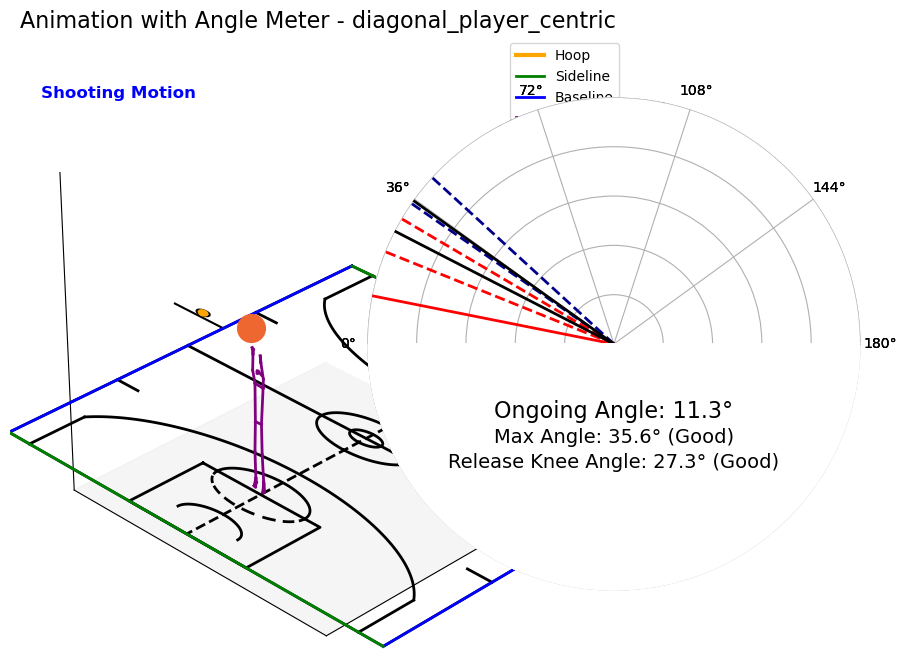

In [19]:
# %%writefile animate_shot_meter_main.py

import logging
import pandas as pd
from IPython.display import display

from animate.animate_from_df_with_shot_meters import animate_trial_with_angle_meter

joint_configs = [
    {
        'name': 'knee',
        'min_angle_key': 'max_knee_angle_filtered_optimal_min',
        'max_angle_key': 'max_knee_angle_filtered_optimal_max',
        'release_min_angle_key': 'release_knee_angle_filtered_optimal_min',
        'release_max_angle_key': 'release_knee_angle_filtered_optimal_max',
        'angle_key': 'knee_angle',
        'is_max_key': 'is_max_knee_angle',
        'classification_key': 'max_knee_shot_classification',
        'release_classification_key': 'release_knee_shot_classification'
    },
    {
        'name': 'elbow',
        'min_angle_key': 'max_elbow_angle_filtered_optimal_min',
        'max_angle_key': 'max_elbow_angle_filtered_optimal_max',
        'release_min_angle_key': 'release_elbow_angle_filtered_optimal_min',
        'release_max_angle_key': 'release_elbow_angle_filtered_optimal_max',
        'angle_key': 'elbow_angle',
        'is_max_key': 'is_max_elbow_angle',
        'classification_key': 'max_elbow_shot_classification',
        'release_classification_key': 'release_elbow_shot_classification'
    },
    {
        'name': 'wrist',
        'min_angle_key': 'max_wrist_angle_filtered_optimal_min',
        'max_angle_key': 'max_wrist_angle_filtered_optimal_max',
        'release_min_angle_key': 'release_wrist_angle_filtered_optimal_min',
        'release_max_angle_key': 'release_wrist_angle_filtered_optimal_max',
        'angle_key': 'wrist_angle',
        'is_max_key': 'is_max_wrist_angle',
        'classification_key': 'max_wrist_shot_classification',
        'release_classification_key': 'release_wrist_shot_classification'
    }
]


# Configure logging for debugging
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def main():
    try:
        # Load data from the specified CSV file
        data_path = "../../data/model/shot_meter_docs/final_granular_logistic_optimized_meter_dataset.csv"
        final_granular_df_with_stats = pd.read_csv(data_path)
        logger.debug(f"Loaded data from {data_path} with shape {final_granular_df_with_stats.shape}")

        # Define connections between joints
        connections = [
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ]
        logger.debug("Defined joint connections for player skeleton.")

        # Select a specific trial for visualization
        trial_id_to_visualize = 'T0089'  # Replace with actual trial ID you want to visualize
        trial_data = final_granular_df_with_stats[final_granular_df_with_stats['trial_id'] == trial_id_to_visualize]
        trial_data = trial_data.sort_values(by='frame_time').reset_index(drop=True)
        logger.debug(f"Selected trial ID '{trial_id_to_visualize}' with {len(trial_data)} frames.")

        # Determine the release frame (the frame where release_point_filter is 1)
        release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
        release_frame = release_frames[0] if release_frames else None
        if release_frame is not None:
            logger.debug(f"Release frame found at index {release_frame}.")
        else:
            logger.warning("No release frame found in the trial data.")

        # Set parameters for visualization
        viewpoint_name = "diagonal_player_centric"  # Choose from COMMON_VIEWPOINTS
        zlim = 15        # Adjust for height

        # Define text_offsets as a list of lists, each sublist corresponds to a joint
        text_offsets = [
            [0.3, 0.35, 0.25],  # For 'knee'
            [0.3, 0.35, 0.25],  # For 'elbow'
            [0.3, 0.35, 0.25]   # For 'wrist'
        ]

        # Call the enhanced animation function with angle meters
        angle_meter_animation_html = animate_trial_with_angle_meter(
            df=trial_data,
            release_frame=release_frame,
            viewpoint_name=viewpoint_name,  # Pass viewpoint_name instead of elev and azim
            connections=connections,
            zlim=zlim,
            joint_configs=joint_configs,  # Pass joint_configs explicitly
            player_color="purple",
            player_lw=2.0,
            ball_color="#ee6730",
            ball_size=20.0,
            highlight_color="red",
            show_court=True,
            court_type="nba",
            units="ft",
            notebook_mode=True,
            debug=True,  # Enable detailed logging for troubleshooting
            text_offsets=text_offsets  # Pass the list of text offsets
        )

        # Display the enhanced animation with angle meters
        display(angle_meter_animation_html)
    except Exception as e:
        logger.error(f"An error occurred in main: {e}")
        raise


if __name__ == "__main__":
    main()


### add on shaps/bayes optimization angles

In [20]:
# %%writefile ../../src/freethrow_predictions/ml/bayes_optimization_ml_df.py

import pandas as pd
import numpy as np
import json
import os
from datetime import datetime
import logging

# Configure logging
logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)

# Define Bayesian metrics and suffixes
BAYESIAN_METRICS = [
    "knee_max_angle", "wrist_max_angle", "elbow_max_angle",
    "release_ball_speed", "release_ball_velocity_x", "release_angle",
    "knee_release_angle", "wrist_release_angle", "elbow_release_angle",
    "release_ball_direction_x", "release_ball_direction_y",
    "release_ball_velocity_y", "release_ball_velocity_z",
    "release_ball_direction_z", "calculated_release_angle"
]

BAYESIAN_SUFFIXES = {
    'min': '_bayes_min',
    'max': '_bayes_max',
    'optimized': '_bayes_optimized_metric'
}

def validate_columns(df: pd.DataFrame, required_columns: list, debug: bool = False) -> bool:
    """
    Validates that all required columns are present in the DataFrame.
    
    Parameters:
        df (pd.DataFrame): The DataFrame to validate.
        required_columns (list): A list of required column names.
        debug (bool): Whether to print debug information.
    
    Returns:
        bool: True if all required columns are present, False otherwise.
    """
    missing_cols = [col for col in required_columns if col not in df.columns]
    if missing_cols:
        if debug:
            logger.warning(f"Missing columns: {missing_cols}")
        return False
    return True

def compute_bayesian_ranges(
    bayesian_metrics_file_path: str,
    final_granular_file_path: str,
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False
) -> pd.DataFrame:
    """
    Computes Bayesian optimized ranges based on the final granular dataset.
    
    Parameters:
    - bayesian_metrics_file_path (str): Path to the Bayesian optimized metrics file.
    - final_granular_file_path (str): Path to the final granular dataset file.
    - output_dir (str): Directory to save output files. Default is "../../data/model/shot_meter_docs/".
    - debug (bool): Whether to print debug information. Default is False.
    
    Returns:
    - pd.DataFrame: DataFrame with Bayesian optimized metrics and computed ranges.
    """
    step_name = "Compute Bayesian Ranges"
    try:
        if debug:
            logger.debug(f"Step: {step_name} - Loading Bayesian optimized metrics data from {bayesian_metrics_file_path}...")
        
        # Load Bayesian optimized metrics data
        bayesian_metrics_data = pd.read_csv(bayesian_metrics_file_path)
        bayesian_columns = [
            "Parameter", 
            "Optimized (Metric)", 
            "Baseline Success Probability",
            "Optimized Success Probability"
        ]
        bayesian_metrics_data = bayesian_metrics_data[bayesian_columns]
        bayesian_metrics_data.rename(
            columns={
                "Optimized (Metric)": "Optimized_Metric",
                "Baseline Success Probability": "Baseline_Success_Prob",
                "Optimized Success Probability": "Optimized_Success_Prob"
            },
            inplace=True
        )
        
        if debug:
            logger.debug(f"Loaded Bayesian metrics data with shape: {bayesian_metrics_data.shape}")
            logger.debug("Bayesian metrics columns and data types:")
            logger.debug(bayesian_metrics_data.dtypes)
        
        if debug:
            logger.debug(f"Step: {step_name} - Loading final granular dataset from {final_granular_file_path}...")
        
        # Load final granular dataset
        final_granular_data = pd.read_csv(final_granular_file_path)
        
        if debug:
            logger.debug(f"Loaded final granular dataset with shape: {final_granular_data.shape}")
            logger.debug("Final granular dataset columns and data types:")
            logger.debug(final_granular_data.dtypes)
        
        if debug:
            logger.debug(f"Step: {step_name} - Checking for missing parameters in the granular dataset...")
        
        # Ensure that all parameters exist in the granular dataset
        missing_params = set(bayesian_metrics_data['Parameter']) - set(final_granular_data.columns)
        if missing_params:
            raise ValueError(f"The following parameters are missing in the final granular dataset: {missing_params}")
        
        if debug:
            logger.debug(f"Step: {step_name} - Computing min and max for each parameter...")
        
        # Compute min and max for each parameter from the granular dataset
        min_max = final_granular_data[bayesian_metrics_data['Parameter']].agg(['min', 'max']).transpose().reset_index()
        min_max.columns = ['Parameter', 'Min_Feature_Value', 'Max_Feature_Value']
        
        if debug:
            logger.debug(f"Computed min and max for parameters with shape: {min_max.shape}")
            logger.debug("Min and Max values sample:")
            logger.debug(min_max.head())
        
        if debug:
            logger.debug(f"Step: {step_name} - Merging Bayesian metrics with min and max values...")
        
        # Merge Bayesian metrics with min and max
        combined_data = pd.merge(
            bayesian_metrics_data, 
            min_max, 
            on='Parameter', 
            how='left'
        )
        
        # Compute the range (max - min)
        combined_data['Feature_Range'] = combined_data['Max_Feature_Value'] - combined_data['Min_Feature_Value']
        
        # Calculate 5% of the feature range for min and max adjustments
        combined_data['Range_5_percent'] = combined_data['Feature_Range'] * 0.05
        
        # Compute bayes_min and bayes_max
        combined_data['Bayes_Min'] = combined_data['Optimized_Metric'] - combined_data['Range_5_percent']
        combined_data['Bayes_Max'] = combined_data['Optimized_Metric'] + combined_data['Range_5_percent']
        
        # Ensure bayes_min and bayes_max do not exceed actual min and max
        combined_data['Bayes_Min'] = combined_data[['Bayes_Min', 'Min_Feature_Value']].max(axis=1)
        combined_data['Bayes_Max'] = combined_data[['Bayes_Max', 'Max_Feature_Value']].min(axis=1)
        
        if debug:
            logger.debug("Computed Bayes_Min and Bayes_Max with sample data:")
            logger.debug(combined_data[['Parameter', 'Bayes_Min', 'Bayes_Max']].head())
        
        if debug:
            logger.debug(f"Step: {step_name} - Combined data shape: {combined_data.shape}")
            logger.debug("Sample of combined data:")
            logger.debug(combined_data.head())
        else:
            print("Step 1: Compute Bayesian ranges completed.")
        
        return combined_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise

def add_bayesian_ranges_to_ml_dataset(
    combined_data: pd.DataFrame,
    final_ml_data_path: str,
    output_path: str = "../../data/model/shot_meter_docs/final_ml_dataset_with_predictions_and_shap_and_bayes.csv",
    debug: bool = False
) -> pd.DataFrame:
    """
    Adds Bayesian min and max ranges to the final ML dataset.
    
    Parameters:
    - combined_data (pd.DataFrame): DataFrame with Bayesian metrics and ranges.
    - final_ml_data_path (str): Path to the final ML dataset file.
    - output_path (str): Path to save the updated ML dataset.
    - debug (bool): Whether to print debug information. Default is False.
    
    Returns:
    - pd.DataFrame: Updated final ML dataset with Bayesian ranges.
    """
    step_name = "Add Bayesian Ranges to ML Dataset"
    try:
        if debug:
            logger.debug(f"Step: {step_name} - Preparing column names for merging...")
        
        # Prepare column names for merging
        combined_data['Combined_Column_Min'] = combined_data['Parameter'].str.lower().str.replace(' ', '_') + BAYESIAN_SUFFIXES['min']
        combined_data['Combined_Column_Max'] = combined_data['Parameter'].str.lower().str.replace(' ', '_') + BAYESIAN_SUFFIXES['max']
        combined_data['Combined_Column_Optimized_Metric'] = combined_data['Parameter'].str.lower().str.replace(' ', '_') + BAYESIAN_SUFFIXES['optimized']
    
        if debug:
            logger.debug("Prepared Combined_Column_Min, Combined_Column_Max, and Combined_Column_Optimized_Metric.")
        
        # Create dictionaries for bayes_min, bayes_max, and optimized_metric
        bayes_min_dict = pd.Series(combined_data['Bayes_Min'].values, index=combined_data['Combined_Column_Min']).to_dict()
        bayes_max_dict = pd.Series(combined_data['Bayes_Max'].values, index=combined_data['Combined_Column_Max']).to_dict()
        optimized_metric_dict = pd.Series(combined_data['Optimized_Metric'].values, index=combined_data['Combined_Column_Optimized_Metric']).to_dict()
    
        if debug:
            logger.debug(f"Step: {step_name} - Loading final ML dataset from {final_ml_data_path}...")
    
        # Load final ML dataset
        final_ml_data = pd.read_csv(final_ml_data_path)
        
        if debug:
            logger.debug(f"Loaded final ML dataset with shape: {final_ml_data.shape}")
            logger.debug("Final ML dataset columns and data types:")
            logger.debug(final_ml_data.dtypes)
        
        if debug:
            logger.debug(f"Step: {step_name} - Initializing bayes_min, bayes_max, and optimized_metric columns with Bayesian ranges...")
        
        # Initialize bayes_min, bayes_max, and optimized_metric columns with Bayesian ranges
        for col, value in bayes_min_dict.items():
            final_ml_data[col] = value
            if debug:
                logger.debug(f"Set '{col}' to {value} for all records.")
        
        for col, value in bayes_max_dict.items():
            final_ml_data[col] = value
            if debug:
                logger.debug(f"Set '{col}' to {value} for all records.")
        
        for col, value in optimized_metric_dict.items():
            final_ml_data[col] = value
            if debug:
                logger.debug(f"Set '{col}' to {value} for all records.")
        
        if debug:
            logger.debug("Bayesian ranges added to the ML dataset.")
        
        # Save the updated ML dataset
        final_ml_data.to_csv(output_path, index=False)
        
        if debug:
            logger.debug(f"Step: {step_name} - Updated ML dataset saved to {output_path}")
            logger.debug(f"Updated ML dataset shape: {final_ml_data.shape}")
            logger.debug("Sample of updated ML dataset:")
            logger.debug(final_ml_data.head())
        else:
            print("Step 2: Add Bayesian ranges to ML dataset completed.")
        
        return final_ml_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise

def classify_metrics(
    final_ml_data: pd.DataFrame,
    bayesian_metrics: list,
    debug: bool = False
) -> pd.DataFrame:
    """
    Classifies each base metric as 'Good', 'Early', or 'Late' based on Bayesian ranges.
    
    Parameters:
    - final_ml_data (pd.DataFrame): The ML dataset with Bayesian ranges.
    - bayesian_metrics (list): List of Bayesian metric names.
    - debug (bool): Whether to print debug information. Default is False.
    
    Returns:
    - pd.DataFrame: Dataset with added classification columns.
    """
    step_name = "Classify Metrics"
    try:
        for metric in bayesian_metrics:
            # Define the column names for the base metric and its Bayesian ranges
            base_metric_col = metric  # Assuming base metrics are named the same as Bayesian metrics
            bayes_min_col = metric + BAYESIAN_SUFFIXES['min']
            bayes_max_col = metric + BAYESIAN_SUFFIXES['max']
            
            # Define the classification column name
            classification_col = metric + BAYESIAN_SUFFIXES['optimized'].replace('_metric', '_classification')
            
            if debug:
                logger.debug(f"Step: {step_name} - Classifying metric '{metric}'...")
            
            # Check if necessary columns exist
            if bayes_min_col not in final_ml_data.columns or bayes_max_col not in final_ml_data.columns:
                if debug:
                    logger.warning(f"Bayesian range columns for '{metric}' not found. Skipping classification for this metric.")
                continue
            
            # Perform classification
            final_ml_data[classification_col] = np.select(
                [
                    final_ml_data[base_metric_col] < final_ml_data[bayes_min_col],
                    final_ml_data[base_metric_col] > final_ml_data[bayes_max_col]
                ],
                ['Early', 'Late'],
                default='Good'
            )
            
            if debug:
                logger.debug(f"Step: {step_name} - Classification added for metric '{metric}'.")
                logger.debug(f"Classification value counts for '{metric}':")
                logger.debug(final_ml_data[classification_col].value_counts())
        
        if debug:
            logger.debug(f"Step: {step_name} - All classifications added.")
            logger.debug(f"Final ML dataset shape after classification: {final_ml_data.shape}")
            classification_cols = [metric + BAYESIAN_SUFFIXES['optimized'].replace('_metric', '_classification') for metric in bayesian_metrics]
            logger.debug(f"Classification Columns: {classification_cols}")
            logger.debug(final_ml_data[classification_cols].head())
        else:
            print("Step 3: Classify metrics completed.")
        
        return final_ml_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise

def bayesian_optimization_ml_df_main(
    bayesian_metrics_file_path: str,
    final_ml_file_path: str,
    final_ml_with_predictions_path: str,
    output_path: str = "../../data/model/shot_meter_docs/final_ml_dataset_with_predictions_and_shap_and_bayes.csv",
    debug: bool = False
) -> pd.DataFrame:
    """
    Main function for Module 1: Bayesian Range Computation and ML Dataset Enhancement.
    
    Parameters:
    - bayesian_metrics_file_path (str): Path to the Bayesian optimized metrics file.
    - final_ml_file_path (str): Path to the final granular dataset file.
    - final_ml_with_predictions_path (str): Path to the final ML dataset with predictions.
    - output_path (str): Path to save the updated ML dataset.
    - debug (bool): Whether to print debug information.
    
    Returns:
    - pd.DataFrame: Enhanced ML dataset with Bayesian ranges and classifications.
    """
    try:
        # Step 1: Compute Bayesian ranges
        combined_data = compute_bayesian_ranges(
            bayesian_metrics_file_path=bayesian_metrics_file_path, 
            final_granular_file_path=final_ml_file_path,
            output_dir=os.path.dirname(output_path),
            debug=debug
        )
        
        if debug:
            logger.debug("\nBayesian Metrics with Computed Ranges:")
            logger.debug(f"Shape: {combined_data.shape}")
            logger.debug(combined_data.head())
        else:
            print("Step 1: Compute Bayesian ranges completed.")
        
        # Step 2: Add Bayesian ranges to ML dataset
        final_ml_bayes_optimized_meter_dataset = add_bayesian_ranges_to_ml_dataset(
            combined_data=combined_data, 
            final_ml_data_path=final_ml_with_predictions_path, 
            output_path=output_path,
            debug=debug
        )
        
        if debug:
            logger.debug("\nFinal ML Dataset with Bayesian Ranges:")
            logger.debug(f"Shape: {final_ml_bayes_optimized_meter_dataset.shape}")
            logger.debug("Columns:")
            logger.debug(final_ml_bayes_optimized_meter_dataset.columns.tolist())
            # Example: Display some bayesian range columns
            bayes_columns = [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'bayes_min' in col or 'bayes_max' in col]
            logger.debug("Sample of Bayesian Range Columns:")
            logger.debug(final_ml_bayes_optimized_meter_dataset[bayes_columns].head())
            optimized_columns = [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'optimized_metric' in col]
            logger.debug("Sample of Optimized Metric Columns:")
            logger.debug(final_ml_bayes_optimized_meter_dataset[optimized_columns].head())
        else:
            print("Step 2: Add Bayesian ranges to ML dataset completed.")
        
        # Bayesian metrics list
        bayesian_metrics = BAYESIAN_METRICS
        
        # Step 3: Classify metrics
        final_ml_bayes_optimized_meter_dataset = classify_metrics(
            final_ml_data=final_ml_bayes_optimized_meter_dataset,
            bayesian_metrics=bayesian_metrics,
            debug=debug
        )
        
        if debug:
            logger.debug("\nFinal ML Dataset with Classifications:")
            logger.debug(f"Shape: {final_ml_bayes_optimized_meter_dataset.shape}")
            classification_cols = [metric + BAYESIAN_SUFFIXES['optimized'].replace('_metric', '_classification') for metric in bayesian_metrics]
            logger.debug(f"Classification Columns: {classification_cols}")
            logger.debug(final_ml_bayes_optimized_meter_dataset[classification_cols].head())
        else:
            print("Step 3: Classify metrics completed.")
        
        return final_ml_bayes_optimized_meter_dataset
    except Exception as e:
        logger.error(f"Error in bayesian_optimization_ml_df_main: {e}")
        raise

# if __name__ == "__main__":
#     # Example usage for testing in Jupyter Notebook or as a standalone script
#     enhanced_ml_data = bayesian_optimization_ml_df_main(
#         bayesian_metrics_file_path="../../data/model/bayesian_optimized_metrics/bayesian_optimized_metrics_comparison_table.csv",
#         final_ml_file_path="../../data/processed/final_ml_dataset.csv",
#         final_ml_with_predictions_path="../../data/model/predictions/final_dataset_with_predictions_and_shap.csv",
#         output_path="../../data/model/shot_meter_docs/final_ml_dataset_with_predictions_and_shap_and_bayes.csv",
#         debug=True
#     )


In [1]:
# bayes_optimization_df.py

import pandas as pd
import numpy as np
import json
import os
import pickle
from datetime import datetime
import logging
from typing import List, Tuple, Dict
import re
import requests
from io import BytesIO

# Configure logging
logger = logging.getLogger('bayes_optimization_df')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)  # Set to DEBUG to capture all logs
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)


def load_features_from_pickle(pickle_path: str, y_variable: str = 'result') -> List[str]:
    """
    Loads features from a pickle file and excludes the y variable.

    Parameters:
        pickle_path (str): Path or URL to the pickle file.
        y_variable (str): The name of the y variable to exclude.

    Returns:
        List[str]: List of feature names excluding the y variable.
    """
    try:
        if pickle_path.startswith('http://') or pickle_path.startswith('https://'):
            response = requests.get(pickle_path)
            response.raise_for_status()
            pickle_file = BytesIO(response.content)
            features_data = pickle.load(pickle_file)
        else:
            with open(pickle_path, 'rb') as f:
                features_data = pickle.load(f)

        # Determine if features_data is a list or a DataFrame
        if isinstance(features_data, pd.DataFrame):
            features = list(features_data.columns)
        elif isinstance(features_data, list):
            features = features_data
        else:
            raise ValueError("Pickle file must contain a list or a DataFrame of features.")

        # Exclude the y variable
        if y_variable in features:
            features.remove(y_variable)

        logger.debug(f"Loaded features from pickle: {features}")
        return features

    except Exception as e:
        logger.error(f"Error loading features from pickle: {e}")
        raise


def parse_shap_recommendation(recommendation: str) -> Tuple[float, float]:
    """
    Parses a shap_recommendation string in various possible formats and returns (shap_min, shap_max).

    Parameters:
        recommendation (str): The shap_recommendation string.

    Returns:
        Tuple[float, float]: (shap_min, shap_max) or (None, None) if parsing fails.
    """
    try:
        if pd.isnull(recommendation):
            raise ValueError("shap_recommendation is NaN")

        # Remove any surrounding whitespace, parentheses, and unwanted characters
        recommendation = recommendation.strip().replace('(', '').replace(')', '').replace('[', '').replace(']', '')

        # Define regex pattern to extract two numbers, possibly negative, separated by any dash-like character
        pattern = r"([-+]?\d*\.?\d+)[\-\–—]+([-+]?\d*\.?\d+)"

        # Use regex to find all matches
        matches = re.findall(pattern, recommendation)
        if len(matches) != 1:
            raise ValueError(f"Invalid shap_recommendation format: '{recommendation}'")

        num1, num2 = float(matches[0][0]), float(matches[0][1])
        shap_min, shap_max = min(num1, num2), max(num1, num2)
        return shap_min, shap_max
    except Exception as e:
        logger.warning(f"Failed to parse shap_recommendation '{recommendation}': {e}")
        return None, None


def compute_bayesian_ranges(
    bayesian_metrics_file_path: str,
    final_granular_file_path: str,
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False,
    bayes_min_max_range: float = 10  # what percent of the range do you want to be taken up by the bayesian range
) -> pd.DataFrame:
    """
    Computes Bayesian optimized ranges based on the final granular dataset.

    Parameters:
        bayesian_metrics_file_path (str): Path to the Bayesian optimized metrics file.
        final_granular_file_path (str): Path to the final granular dataset file.
        output_dir (str): Directory to save output files. Default is "../../data/model/shot_meter_docs/".
        debug (bool): Whether to print debug information. Default is False.
        bayes_min_max_range (float): Percentage of the feature range to allocate to the bayesian range.

    Returns:
        pd.DataFrame: DataFrame with Bayesian optimized metrics and computed ranges.
    """
    step_name = "Compute Bayesian Ranges"
    try:
        if debug:
            logger.debug(f"Step: {step_name} - Loading Bayesian optimized metrics data from {bayesian_metrics_file_path}...")

        # Load Bayesian optimized metrics data
        bayesian_metrics_data = pd.read_csv(bayesian_metrics_file_path)
        required_columns = [
            "Parameter",
            "Optimized (Metric)",
            "Baseline Success Probability",
            "Optimized Success Probability"
        ]
        bayesian_metrics_data = bayesian_metrics_data[required_columns]
        bayesian_metrics_data.rename(
            columns={
                "Optimized (Metric)": "Optimized_Metric",
                "Baseline Success Probability": "Baseline_Success_Prob",
                "Optimized Success Probability": "Optimized_Success_Prob"
            },
            inplace=True
        )

        if debug:
            logger.debug(f"Loaded Bayesian metrics data with shape: {bayesian_metrics_data.shape}")
            logger.debug("Bayesian metrics columns and data types:")
            logger.debug(bayesian_metrics_data.dtypes)

        if debug:
            logger.debug(f"Step: {step_name} - Loading final granular dataset from {final_granular_file_path}...")

        # Load final granular dataset
        final_granular_data = pd.read_csv(final_granular_file_path)

        if debug:
            logger.debug(f"Loaded final granular dataset with shape: {final_granular_data.shape}")
            logger.debug("Final granular dataset columns and data types:")
            logger.debug(final_granular_data.dtypes)

        if debug:
            logger.debug(f"Step: {step_name} - Checking for missing parameters in the granular dataset...")

        # Ensure that all parameters exist in the granular dataset
        missing_params = set(bayesian_metrics_data['Parameter']) - set(final_granular_data.columns)
        if missing_params:
            raise ValueError(f"The following parameters are missing in the final granular dataset: {missing_params}")

        if debug:
            logger.debug(f"Step: {step_name} - Computing min and max for each parameter...")

        # Compute min and max for each parameter from the granular dataset
        min_max = final_granular_data[bayesian_metrics_data['Parameter']].agg(['min', 'max']).transpose().reset_index()
        min_max.columns = ['Parameter', 'Min_Feature_Value', 'Max_Feature_Value']

        if debug:
            logger.debug(f"Computed min and max for parameters with shape: {min_max.shape}")
            logger.debug("Min and Max values sample:")
            logger.debug(min_max.head())

        if debug:
            logger.debug(f"Step: {step_name} - Merging Bayesian metrics with min and max values...")

        # Merge Bayesian metrics with min and max
        combined_data = pd.merge(
            bayesian_metrics_data,
            min_max,
            on='Parameter',
            how='left'
        )

        # Compute the range (max - min)
        combined_data['Feature_Range'] = combined_data['Max_Feature_Value'] - combined_data['Min_Feature_Value']

        # Calculate percentage of the feature range for min and max adjustments
        combined_data['Range_percent'] = combined_data['Feature_Range'] * bayes_min_max_range / 100

        # Compute bayes_min and bayes_max
        combined_data['Bayes_Min'] = combined_data['Optimized_Metric'] - combined_data['Range_percent']
        combined_data['Bayes_Max'] = combined_data['Optimized_Metric'] + combined_data['Range_percent']

        # Ensure bayes_min and bayes_max do not exceed actual min and max
        combined_data['Bayes_Min'] = combined_data[['Bayes_Min', 'Min_Feature_Value']].max(axis=1)
        combined_data['Bayes_Max'] = combined_data[['Bayes_Max', 'Max_Feature_Value']].min(axis=1)

        if debug:
            logger.debug("Computed Bayes_Min and Bayes_Max with sample data:")
            logger.debug(combined_data[['Parameter', 'Bayes_Min', 'Bayes_Max']].head())

        # Save combined data with fixed filename
        output_filename = "combined_bayesian_metrics.csv"
        output_path = os.path.join(output_dir, output_filename)
        combined_data.to_csv(output_path, index=False)

        if debug:
            logger.debug(f"Step: {step_name} - Combined data shape: {combined_data.shape}")
            logger.debug("Sample of combined data:")
            logger.debug(combined_data.head())
            logger.debug(f"Combined data saved to {output_path}")
        else:
            print(f"Step 1: {step_name} completed.")

        return combined_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise


def add_bayesian_ranges_to_ml_dataset(
    combined_data: pd.DataFrame,
    final_ml_data_path: str,
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False
) -> pd.DataFrame:
    """
    Adds Bayesian min and max ranges to the final ML dataset.

    Parameters:
        combined_data (pd.DataFrame): DataFrame with Bayesian metrics and ranges.
        final_ml_data_path (str): Path to the final ML dataset file.
        output_dir (str): Directory to save output files. Default is "../../data/model/shot_meter_docs/".
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        pd.DataFrame: Updated final ML dataset with Bayesian ranges.
    """
    step_name = "Add Bayesian Ranges to ML Dataset"
    try:
        if debug:
            logger.debug(f"Step: {step_name} - Preparing column names for merging...")

        # Prepare column names for merging
        combined_data['Combined_Column_Min'] = combined_data['Parameter'].str.lower().str.replace(' ', '_') + '_bayes_min'
        combined_data['Combined_Column_Max'] = combined_data['Parameter'].str.lower().str.replace(' ', '_') + '_bayes_max'
        # Prepare column names for Optimized Metric
        combined_data['Combined_Column_Optimized_Metric'] = combined_data['Parameter'].str.lower().str.replace(' ', '_') + '_optimized_metric'

        if debug:
            logger.debug("Prepared Combined_Column_Min, Combined_Column_Max, and Combined_Column_Optimized_Metric.")

        # Create dictionaries for bayes_min, bayes_max, and optimized_metric
        bayes_min_dict = pd.Series(combined_data['Bayes_Min'].values, index=combined_data['Combined_Column_Min']).to_dict()
        bayes_max_dict = pd.Series(combined_data['Bayes_Max'].values, index=combined_data['Combined_Column_Max']).to_dict()
        optimized_metric_dict = pd.Series(combined_data['Optimized_Metric'].values, index=combined_data['Combined_Column_Optimized_Metric']).to_dict()

        if debug:
            logger.debug(f"Step: {step_name} - Loading final ML dataset from {final_ml_data_path}...")

        # Load final ML dataset
        final_ml_data = pd.read_csv(final_ml_data_path)

        if debug:
            logger.debug(f"Loaded final ML dataset with shape: {final_ml_data.shape}")
            logger.debug("Final ML dataset columns and data types:")
            logger.debug(final_ml_data.dtypes)

        if debug:
            logger.debug(f"Step: {step_name} - Initializing bayes_min, bayes_max, and optimized_metric columns with Bayesian ranges...")

        # Add Bayesian range columns
        for col, value in bayes_min_dict.items():
            final_ml_data[col] = value
            if debug:
                logger.debug(f"Added/Updated column '{col}' with Bayes_Min value {value}.")

        for col, value in bayes_max_dict.items():
            final_ml_data[col] = value
            if debug:
                logger.debug(f"Added/Updated column '{col}' with Bayes_Max value {value}.")

        # Add Optimized Metric columns
        for col, value in optimized_metric_dict.items():
            final_ml_data[col] = value
            if debug:
                logger.debug(f"Added/Updated column '{col}' with Optimized_Metric value {value}.")

        if debug:
            logger.debug("Bayesian ranges added to the ML dataset.")

        # Save updated ML dataset with fixed filename
        output_filename = "ml_dataset_with_bayesian_ranges.csv"
        output_path = os.path.join(output_dir, output_filename)
        final_ml_data.to_csv(output_path, index=False)

        if debug:
            logger.debug(f"Step: {step_name} - Updated dataset shape: {final_ml_data.shape}")
            logger.debug(f"Step: {step_name} - Updated dataset columns: {final_ml_data.columns.tolist()}")
            logger.debug(f"Updated dataset saved to {output_path}")
        else:
            print(f"Step 2: {step_name} completed.")

        return final_ml_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise


def classify_metrics(
    final_ml_data: pd.DataFrame,
    bayesian_metrics: List[str],
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False
) -> pd.DataFrame:
    """
    Classifies each base metric as 'Good', 'Early', or 'Late' based on Bayesian ranges.

    Parameters:
        final_ml_data (pd.DataFrame): The ML dataset with Bayesian ranges.
        bayesian_metrics (List[str]): List of Bayesian metric names.
        output_dir (str): Directory to save output files. Default is "../../data/model/shot_meter_docs/".
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        pd.DataFrame: Dataset with added classification columns.
    """
    step_name = "Classify Metrics"
    try:
        for metric in bayesian_metrics:
            # Define the column names for the base metric and its Bayesian ranges
            base_metric_col = metric  # Assuming base metrics are named the same as Bayesian metrics
            bayes_min_col = f"{metric}_bayes_min"
            bayes_max_col = f"{metric}_bayes_max"

            # Define the classification column name
            classification_col = f"{metric}_bayes_classification"

            if debug:
                logger.debug(f"Step: {step_name} - Classifying metric '{metric}'...")

            # Check if necessary columns exist
            if bayes_min_col not in final_ml_data.columns or bayes_max_col not in final_ml_data.columns:
                if debug:
                    logger.warning(f"Bayesian range columns for '{metric}' not found. Skipping classification for this metric.")
                else:
                    print(f"Step {step_name}: Bayesian range columns for '{metric}' not found. Skipping classification.")
                continue

            # Perform classification
            final_ml_data[classification_col] = np.select(
                [
                    final_ml_data[base_metric_col] < final_ml_data[bayes_min_col],
                    final_ml_data[base_metric_col] > final_ml_data[bayes_max_col]
                ],
                ['Early', 'Late'],
                default='Good'
            )

        if debug:
            logger.debug(f"Step: {step_name} - Classification completed for all metrics.")
            # Log summary of classifications
            parsed_metrics = [m for m in bayesian_metrics if f"{m}_bayes_classification" in final_ml_data.columns]
            for metric in parsed_metrics:
                classification_col = f"{metric}_bayes_classification"
                value_counts = final_ml_data[classification_col].value_counts()
                logger.debug(f"Classification value counts for '{metric}':")
                logger.debug(value_counts.to_dict())
        else:
            print(f"Step {step_name}: Classified metrics for all specified metrics completed.")

        # Save classified dataset with fixed filename
        output_filename = "classified_ml_dataset.csv"
        output_path = os.path.join(output_dir, output_filename)
        final_ml_data.to_csv(output_path, index=False)

        if debug:
            logger.debug(f"Step: {step_name} - Classified dataset saved to {output_path}")
        else:
            print("Step 3: Classify metrics completed.")

        return final_ml_data
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise


def merge_bayes_metrics_with_granular_data(
    final_granular_dataset: pd.DataFrame,
    final_ml_bayes_optimized_meter_dataset: pd.DataFrame,
    bayesian_metrics: List[str],
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False
) -> pd.DataFrame:
    """
    Merge Bayesian optimized metrics and SHAP recommendations into the granular dataset.

    Parameters:
        final_granular_dataset (pd.DataFrame): Frame-by-frame trial data.
        final_ml_bayes_optimized_meter_dataset (pd.DataFrame): Dataset with Bayesian metrics and SHAP recommendations.
        bayesian_metrics (List[str]): List of Bayesian metric names.
        output_dir (str): Directory to save output files. Default is "../../data/model/shot_meter_docs/".
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        pd.DataFrame: The merged dataset with Bayesian metrics and SHAP recommendations.
    """
    step_name = "Merge Bayesian Metrics with Granular Dataset"
    try:
        if debug:
            logger.debug(f"Step: {step_name} - Checking trial_id alignment...")
            unique_granular = final_granular_dataset['trial_id'].nunique()
            unique_ml = final_ml_bayes_optimized_meter_dataset['trial_id'].nunique()
            logger.debug(f"Unique trial_ids in granular dataset: {unique_granular}")
            logger.debug(f"Unique trial_ids in Bayesian metrics dataset: {unique_ml}")

        if debug:
            logger.debug(f"Step: {step_name} - Performing left join on 'trial_id'...")

        # Perform the left join
        merged_dataset = final_granular_dataset.merge(
            final_ml_bayes_optimized_meter_dataset,
            on='trial_id',
            how='left',
            suffixes=('', '_meter')
        )
        
        # Verify SHAP columns presence
        shap_columns_expected = []
        for metric in bayesian_metrics:
            shap_columns_expected.extend([
                f"{metric}_shap_importance",
                f"{metric}_shap_recommendation",
                f"{metric}_shap_status",
                f"{metric}_shap_direction"  # Added shap_direction
            ])
        
        missing_shap_columns = [col for col in shap_columns_expected if col not in merged_dataset.columns]
        if debug:
            if missing_shap_columns:
                logger.warning(f"Missing SHAP columns: {missing_shap_columns}")
            else:
                logger.debug("All expected SHAP columns are present in the merged dataset.")

        # Save merged dataset with fixed filename
        output_filename = "bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv"
        output_path = os.path.join(output_dir, output_filename)
        merged_dataset.to_csv(output_path, index=False)

        if debug:
            logger.debug(f"Step: {step_name} - Merged dataset shape: {merged_dataset.shape}")
            logger.debug(f"Step: {step_name} - Merged dataset saved to {output_path}")
            logger.debug("Sample of merged dataset:")
            logger.debug(merged_dataset.head())
        else:
            print(f"Step 5: {step_name} completed.")

        return merged_dataset
    except Exception as e:
        logger.error(f"Error in {step_name}: {e}")
        raise


def bayesian_optimized_granular_data_main(
    bayesian_metrics_file_path: str = "../../data/default_spl_example/bayesian_optimized_metrics/bayesian_optimized_metrics_comparison_table.csv",
    final_ml_file_path: str = "../../data/processed/final_ml_dataset.csv",
    final_ml_with_predictions_path: str = "../../data/model/predictions/final_dataset_with_predictions_and_shap.csv",
    final_granular_file_path: str = "../../data/processed/final_granular_dataset.csv",
    pickle_path: str = "../../data/model/feature_names.pkl",  # Updated to match existing paths
    y_variable: str = "result",  # Added y_variable parameter
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False,
    bayes_min_max_range: float = 10
) -> Tuple[pd.DataFrame, Dict[str, Dict[str, float]]]:
    """
    Main function to execute Bayesian optimization data processing.

    Parameters:
        bayesian_metrics_file_path (str): Path to the Bayesian optimized metrics file.
        final_ml_file_path (str): Path to the final ML dataset file.
        final_ml_with_predictions_path (str): Path to the final ML dataset with predictions.
        final_granular_file_path (str): Path to the final granular dataset file.
        pickle_path (str): Path or URL to the pickle file containing feature names.
        y_variable (str): The name of the y variable to exclude from features.
        output_dir (str): Directory to save output files.
        debug (bool): Whether to print debug information.
        bayes_min_max_range (float): Percentage of the feature range to allocate to the bayesian range.

    Returns:
        Tuple[pd.DataFrame, Dict[str, Dict[str, float]]]: (merged_data, bayesian_metrics_dict)
    """
    step_name = "Bayesian Optimization Data Processing"
    try:
        if debug:
            logger.debug(f"Starting main function: {step_name}")

        # **Step 0: Load Feature Names from Pickle**
        # ---------------------------------------------
        if debug:
            logger.debug(f"Step 0: Loading feature names from pickle at '{pickle_path}'...")

        bayesian_metrics = load_features_from_pickle(pickle_path=pickle_path, y_variable=y_variable)

        if debug:
            logger.debug(f"Loaded Bayesian metrics: {bayesian_metrics}")

        # **Step 1: Compute Bayesian ranges**
        # ---------------------------------------------
        combined_data = compute_bayesian_ranges(
            bayesian_metrics_file_path=bayesian_metrics_file_path,
            final_granular_file_path=final_ml_file_path,
            output_dir=output_dir,
            debug=debug,
            bayes_min_max_range=bayes_min_max_range  # what percent of the range do you want to be taken up by the bayesian range
        )
        
        # **Step 2: Add Bayesian ranges to ML dataset**
        # ---------------------------------------------
        final_ml_bayes_optimized_meter_dataset = add_bayesian_ranges_to_ml_dataset(
            combined_data=combined_data,
            final_ml_data_path=final_ml_with_predictions_path,
            output_dir=output_dir,
            debug=debug
        )
        
        # **Step 3: Classify metrics**
        # ---------------------------------------------
        final_ml_bayes_optimized_meter_dataset = classify_metrics(
            final_ml_data=final_ml_bayes_optimized_meter_dataset,
            bayesian_metrics=bayesian_metrics,  # Use the dynamically loaded list
            output_dir=output_dir,
            debug=debug
        )
        
        # **Step 4: Check on SHAP-specific data (if needed)**
        # ---------------------------------------------
        if debug:
            # Example: Display shap recommendations columns
            shap_recommendation_columns = [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'shap_recommendation' in col.lower()]
            shap_status_columns = [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'shap_status' in col.lower()]
            shap_specific_columns = [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'shap_specific' in col.lower()]
            shap_direction_columns = [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'shap_direction' in col.lower()]
            shap_trial_columns = [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'shap_trial' in col.lower()]

            shap_bayes_columns = shap_status_columns + shap_recommendation_columns + shap_specific_columns + shap_direction_columns + shap_trial_columns + [col for col in final_ml_bayes_optimized_meter_dataset.columns if 'bayes_' in col]
            logger.debug("\nSample of Final Dataset with SHAP and Bayesian Metrics:")
            final_dataset_with_bayesian_and_shap_filtered = final_ml_bayes_optimized_meter_dataset[shap_bayes_columns]
            logger.debug(final_dataset_with_bayesian_and_shap_filtered.head())

        # **Step 5: Merge Bayesian metrics with granular dataset**
        # ---------------------------------------------
        merged_data = merge_bayes_metrics_with_granular_data(
            final_granular_dataset=pd.read_csv(final_granular_file_path),
            final_ml_bayes_optimized_meter_dataset=final_ml_bayes_optimized_meter_dataset,
            bayesian_metrics=bayesian_metrics,  # Pass the dynamic bayesian_metrics list
            output_dir=output_dir,
            debug=debug
        )

        # **Step 6: Create bayesian_metrics_dict without shap_recommendation, shap_min, shap_max**
        # ---------------------------------------------
        bayesian_metrics_dict = {}
        for metric in bayesian_metrics:
            bayes_min_col = f"{metric}_bayes_min"
            bayes_max_col = f"{metric}_bayes_max"
            optimized_metric_col = f"{metric}_optimized_metric"
            original_col = metric  # Assuming the original metric column is named exactly as the metric
            bayes_classification_col = f"{metric}_bayes_classification"
            shap_importance_col = f"{metric}_shap_importance"

            # Ensure columns exist
            required_columns = [
                bayes_min_col,
                bayes_max_col,
                optimized_metric_col,
                original_col,
                bayes_classification_col,
                shap_importance_col
            ]

            if all(col in merged_data.columns for col in required_columns):
                bayesian_metrics_dict[metric] = {
                    'bayes_min': merged_data.at[0, bayes_min_col],
                    'bayes_max': merged_data.at[0, bayes_max_col],
                    'optimal': merged_data.at[0, optimized_metric_col],
                    'original': merged_data.at[0, original_col],
                    'bayes_classification': merged_data.at[0, bayes_classification_col],
                    'shap_importance': merged_data.at[0, shap_importance_col]
                }
            else:
                if debug:
                    missing = [col for col in required_columns if col not in merged_data.columns]
                    logger.warning(f"Missing columns {missing} for metric '{metric}'. Skipping.")
        
        # **Add filter_name based on no_change_list**
        # ---------------------------------------------
        no_change_list = ["calculated_release_angle", "release_angle"]

        for metric, values in bayesian_metrics_dict.items():
            if metric in no_change_list:
                # Do not modify the metric name
                filter_name = metric
            else:
                # Remove "release_" and "_max" if they exist
                filter_name = metric.replace("release_", "").replace("_max", "")
            
            # Add the filter_name to the dictionary
            bayesian_metrics_dict[metric]['filter_name'] = filter_name

        # **Optional: Add SHAP Directions if needed**
        # ---------------------------------------------
        for metric in bayesian_metrics:
            shap_direction_col = f"{metric}_shap_direction"

            if shap_direction_col in merged_data.columns:
                shap_direction = merged_data.at[0, shap_direction_col]
                bayesian_metrics_dict[metric]['shap_direction'] = shap_direction
                if debug:
                    logger.debug(f"Extracted '{shap_direction_col}': shap_direction={shap_direction}")
            else:
                if debug:
                    logger.warning(f"Missing shap_direction column '{shap_direction_col}' for metric '{metric}'. Setting shap_direction to None.")
                bayesian_metrics_dict[metric]['shap_direction'] = None

        if debug:
            # Summary of parsing results
            parsed_metrics = [m for m, v in bayesian_metrics_dict.items() if v.get('shap_importance') is not None]
            logger.debug(f"Total metrics parsed successfully: {len(parsed_metrics)}")

            # Log inclusion of new SHAP fields
            for metric, details in bayesian_metrics_dict.items():
                if 'shap_importance' in details:
                    logger.debug(f"Metric '{metric}': shap_importance={details['shap_importance']}")
                else:
                    logger.debug(f"Metric '{metric}': Missing shap_importance.")

            logger.debug("Bayesian Metrics Dictionary without SHAP Recommendations:")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))

        # Save bayesian_metrics_dict with fixed filename
        bayesian_metrics_output_path = os.path.join(output_dir, "bayesian_metrics_dict.json")
        with open(bayesian_metrics_output_path, 'w') as f:
            json.dump(bayesian_metrics_dict, f, indent=4)

        if debug:
            logger.debug(f"Bayesian metrics dictionary saved to {bayesian_metrics_output_path}")
        else:
            print("Step 6: Bayesian metrics dictionary created and saved.")

        return merged_data, bayesian_metrics_dict
    except Exception as e:
        logger.error(f"Error: {e}")
        raise


if __name__ == "__main__":
    # Example usage for testing in Jupyter Notebook or as a script
    try:
        merged_data, bayesian_metrics_dict = bayesian_optimized_granular_data_main(
            bayesian_metrics_file_path="../../data/model/bayesian_optimized_metrics/bayesian_optimized_metrics_comparison_table.csv",
            final_ml_file_path="../../data/processed/final_ml_dataset.csv",
            final_ml_with_predictions_path="../../data/model/predictions/final_dataset_with_predictions_and_shap.csv",
            final_granular_file_path="../../data/processed/final_granular_dataset.csv",
            pickle_path="../../data/model/pipeline/final_ml_df_selected_features_columns.pkl",  # Ensure this path is correct
            y_variable="result",  # Specify your y variable name
            output_dir="../../data/model/shot_meter_docs/",
            debug=True,
            bayes_min_max_range=20
        )
        logger.debug("Sample 'elbow_release_angle_shap_recommendation':")

        # Print all columns to verify presence
        logger.debug(merged_data.columns.to_list())
    except Exception as main_e:
        logger.error(f"An error occurred during main execution: {main_e}")


2024-12-14 12:09:10,396 - DEBUG - Starting main function: Bayesian Optimization Data Processing
2024-12-14 12:09:10,397 - DEBUG - Step 0: Loading feature names from pickle at '../../data/model/pipeline/final_ml_df_selected_features_columns.pkl'...
2024-12-14 12:09:10,408 - DEBUG - Loaded features from pickle: ['release_ball_direction_x', 'release_ball_direction_z', 'release_ball_direction_y', 'elbow_release_angle', 'elbow_max_angle', 'wrist_release_angle', 'wrist_max_angle', 'knee_release_angle', 'knee_max_angle', 'release_ball_speed', 'release_ball_velocity_x', 'release_ball_velocity_y', 'release_ball_velocity_z', 'calculated_release_angle']
2024-12-14 12:09:10,408 - DEBUG - Loaded Bayesian metrics: ['release_ball_direction_x', 'release_ball_direction_z', 'release_ball_direction_y', 'elbow_release_angle', 'elbow_max_angle', 'wrist_release_angle', 'wrist_max_angle', 'knee_release_angle', 'knee_max_angle', 'release_ball_speed', 'release_ball_velocity_x', 'release_ball_velocity_y', 'rele

In [2]:
# bayes_angle_meter.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from datetime import datetime
import re
import json

# Configure logging only once
logger = logging.getLogger('bayes_angle_meter')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

def get_timestamp() -> str:
    """Returns the current timestamp formatted as YYYYMMDD_HHMMSS."""
    return datetime.now().strftime("%Y%m%d_%H%M%S")

def parse_shap_recommendation(recommendation: str) -> tuple:
    """
    Parses a shap_recommendation string and returns (shap_min, shap_max).

    Parameters:
    - recommendation (str): The shap_recommendation string.

    Returns:
    - tuple: (shap_min, shap_max) or (None, None) if parsing fails.
    """
    try:
        if pd.isnull(recommendation):
            raise ValueError("shap_recommendation is NaN")

        # Remove any surrounding whitespace, parentheses, and unwanted characters
        recommendation = recommendation.strip().replace('(', '').replace(')', '').replace('[', '').replace(']', '')

        # Define regex pattern to extract two numbers, possibly negative, separated by any dash-like character
        pattern = r"([-+]?\d*\.?\d+)[\-\–—]+([-+]?\d*\.?\d+)"

        # Use regex to find all matches
        matches = re.findall(pattern, recommendation)
        if len(matches) != 1:
            raise ValueError(f"Invalid shap_recommendation format: '{recommendation}'")

        num1, num2 = float(matches[0][0]), float(matches[0][1])
        shap_min, shap_max = min(num1, num2), max(num1, num2)
        return shap_min, shap_max
    except Exception as e:
        logger.warning(f"Failed to parse shap_recommendation '{recommendation}': {e}")
        return None, None

def update_bayes_angle_meter(
    ax_meter: plt.Axes,
    df: pd.DataFrame,
    frame: int,
    needle: plt.Line2D,
    angle_text: plt.Text,
    bayes_classification_text: plt.Text,
    shap_importance_text: plt.Text,
    shap_direction_text: plt.Text,
    bayesian_metrics_dict: dict,
    selected_metric: str,
    debug: bool = False
) -> None:
    """
    Update the angle meter based on the selected metric and current frame data.
    """
    try:
        metric_key = selected_metric.lower()
        metric_info = bayesian_metrics_dict.get(metric_key, {})
        if not metric_info:
            logger.error(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")

        # Ongoing metric value
        ongoing_value = df.at[frame, metric_info['filter_name']]
        ongoing_angle_rad = ongoing_value * np.pi / 180  # Convert to radians

        # Update needle position
        needle.set_data([0, ongoing_angle_rad], [0, 1])

        # Update angle text
        angle_text.set_text(f'Ongoing {metric_info["filter_name"].replace("_", " ").capitalize()}: {ongoing_value:.1f}°')

        # Update Bayesian Classification
        classification = metric_info['bayes_classification']
        bayes_classification_text.set_text(f'Bayesian Classification: {classification}')

        # Update SHAP Importance
        shap_importance = metric_info['shap_importance']
        shap_importance_text.set_text(f'SHAP Importance: {shap_importance:.4f}')

        # Update SHAP Direction with arrows/icons
        shap_direction = metric_info['shap_direction']
        if shap_direction.lower() == 'positive':
            shap_direction_text.set_text('Direction: ▲ Increase this metric')
            shap_direction_text.set_color('green')
        elif shap_direction.lower() == 'negative':
            shap_direction_text.set_text('Direction: ▼ Decrease this metric')
            shap_direction_text.set_color('red')
        else:
            shap_direction_text.set_text('Direction: N/A')
            shap_direction_text.set_color('black')

        if debug:
            logger.debug(
                f"Frame {frame}: {metric_info['filter_name']} = {ongoing_value:.1f}°, "
                f"Classification: '{classification}', SHAP Importance: {shap_importance:.4f}, "
                f"SHAP Direction: '{shap_direction}'."
            )

    except KeyError as e:
        logger.error(f"Missing column during angle meter update: {e}")
        raise
    except Exception as e:
        logger.error(f"Error in update_bayes_angle_meter: {e}")
        raise

def add_bayes_optimal_lines(
    ax: plt.Axes,
    min_angle: float,
    max_angle: float,
    debug: bool = False
) -> None:
    """
    Add optimal min and max lines to the angle meter, including release min and max angles.
    """
    try:
        # Convert angles to radians
        min_angle_rad = min_angle * np.pi / 180
        max_angle_rad = max_angle * np.pi / 180

        # Plotting optimal min and max lines with distinct colors and labels
        ax.plot([0, min_angle_rad], [0, 1], color='blue', lw=2, linestyle="--", label='Bayes Min')
        ax.plot([0, max_angle_rad], [0, 1], color='green', lw=2, linestyle="--", label='Bayes Max')

        if debug:
            logger.debug(
                f"Added optimal lines at {min_angle}°, {max_angle}° with labels 'Bayes Min' and 'Bayes Max'."
            )
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines: {e}")
        raise

def create_bayes_angle_meter(
    fig: plt.Figure,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    text_offsets: dict,
    debug: bool = False
) -> tuple:
    """
    Create an angle meter plot for the selected metric using bayesian_metrics_dict.
    """
    try:
        # Validate selected_metric
        metric_key = selected_metric.lower()
        if metric_key not in bayesian_metrics_dict:
            logger.error(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Metric '{selected_metric}' not found in bayesian_metrics_dict.")

        metric_info = bayesian_metrics_dict[metric_key]
        bayes_min = metric_info['bayes_min']
        bayes_max = metric_info['bayes_max']
        bayes_classification = metric_info['bayes_classification']
        shap_importance = metric_info['shap_importance']
        shap_direction = metric_info['shap_direction']

        # Set up angle meter as a polar subplot for half-circle (180 degrees)
        ax_meter = fig.add_subplot(122, polar=True)
        ax_meter.set_theta_offset(np.pi)  # Rotate to make it horizontal
        ax_meter.set_theta_direction(-1)  # Counter-clockwise

        # Define 180-degree range with ticks and labels
        angle_ticks = np.linspace(0, np.pi, 6)
        angle_labels = [f'{int(angle)}°' for angle in np.linspace(0, 180, 6)]
        ax_meter.set_xticks(angle_ticks)
        ax_meter.set_xticklabels(angle_labels)
        ax_meter.set_yticklabels([])  # Hide radial labels for clarity

        # Limit the radial display to the upper half
        ax_meter.set_ylim(0, 1)  # Only show radial values from 0 to 1

        # Hide the lower half of the plot by masking the unwanted area
        ax_meter.set_facecolor("white")  # Set facecolor to blend with background
        ax_meter.fill_between(np.linspace(np.pi, 2 * np.pi, 100), 0, 1, color="white", zorder=10)  # Cover bottom half

        # Remove the full circular outline and add a 180-degree dividing line
        ax_meter.spines['polar'].set_visible(False)  # Hide full circular outline
        ax_meter.plot([0, np.pi], [0, 1], color='black', lw=1)  # Add a line along 180 degrees

        # Add Bayesian Min and Max lines with distinct colors and styles
        bayes_min_rad = bayes_min * np.pi / 180
        bayes_max_rad = bayes_max * np.pi / 180
        ax_meter.plot([0, bayes_min_rad], [0, 1], color='blue', lw=2, linestyle="--", label='Bayes Min')
        ax_meter.plot([0, bayes_max_rad], [0, 1], color='green', lw=2, linestyle="--", label='Bayes Max')

        # Initialize the needle and text placeholders with adjustable y-positions
        needle, = ax_meter.plot([], [], color='red', lw=3, label='Current Angle')  # Thicker and distinct color
        angle_text = ax_meter.text(
            0.5, text_offsets['angle_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=14, weight='bold', zorder=15
        )
        bayes_classification_text = ax_meter.text(
            0.5, text_offsets['bayes_classification_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=12, color='orange', zorder=15
        )
        shap_importance_text = ax_meter.text(
            0.5, text_offsets['shap_importance_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=12, color='purple', zorder=15
        )
        shap_direction_text = ax_meter.text(
            0.5, text_offsets['shap_direction_text_y'], '', transform=ax_meter.transAxes,
            ha='center', fontsize=12, zorder=15
        )

        # Add legend to explain the lines
        ax_meter.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

        if debug:
            logger.debug(f"Angle meter for '{selected_metric}' initialized with needle and angle text placeholders.")

        return ax_meter, needle, angle_text, bayes_classification_text, shap_importance_text, shap_direction_text
    except Exception as e:
        logger.error(f"Error: {e}")
        raise

def initialize_bayes_angle_meter(
    fig: plt.Figure,
    df: pd.DataFrame,
    metric: str,
    bayesian_metrics_dict: dict,
    text_offsets: dict,
    debug: bool = False
) -> dict:
    """
    Initialize the angle meter for the selected metric using bayesian_metrics_dict.
    """
    angle_meter_obj = {}
    try:
        if metric.lower() not in bayesian_metrics_dict:
            logger.error(f"Metric '{metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Metric '{metric}' not found in bayesian_metrics_dict.")

        # Create angle meter
        ax_meter, needle, angle_text, bayes_classification_text, shap_importance_text, shap_direction_text = create_bayes_angle_meter(
            fig=fig,
            selected_metric=metric,
            bayesian_metrics_dict=bayesian_metrics_dict,
            text_offsets=text_offsets,
            debug=debug
        )

        angle_meter_obj = {
            'ax_meter': ax_meter,
            'needle': needle,
            'angle_text': angle_text,
            'bayes_classification_text': bayes_classification_text,
            'shap_importance_text': shap_importance_text,
            'shap_direction_text': shap_direction_text,
            'metric': metric  # Store metric name for reference
        }

        if debug:
            logger.debug(f"Initialized angle meter for metric '{metric}'.")

    except Exception as e:
        logger.error(f"Error initializing angle meter for metric '{metric}': {e}")
        raise
    return angle_meter_obj


2024-12-14 12:09:49,486 - DEBUG - Loaded Bayesian metrics dictionary from ../../data/model/shot_meter_docs/bayesian_metrics_dict.json


2024-12-14 12:09:49,486 - DEBUG - {
    "release_ball_direction_x": {
        "bayes_min": 0.4045024265780041,
        "bayes_max": 0.5083172720043937,
        "optimal": 0.5044260268247447,
        "original": 0.3770123170199189,
        "bayes_classification": "Early",
        "shap_importance": 0.157,
        "filter_name": "ball_direction_x",
        "shap_direction": "negative"
    },
    "release_ball_direction_z": {
        "bayes_min": 0.9161985108656159,
        "bayes_max": 0.9705480916167188,
        "optimal": 0.9433733012411674,
        "original": 0.926203487482012,
        "bayes_classification": "Good",
        "shap_importance": 0.2527,
        "filter_name": "ball_direction_z",
        "shap_direction": "negative"
    },
    "release_ball_direction_y": {
        "bayes_min": -0.19291300478054946,
        "bayes_max": -0.02533856674236333,
        "optimal": -0.1091257857614564,
        "original": 0.0029686009214166,
        "bayes_classification": "Late",
        "sh

2024-12-14 12:09:53,178 - DEBUG - Frame 121: wrist_angle = 25.7°, Classification: 'Good', SHAP Importance: 0.2888, SHAP Direction: 'negative'.


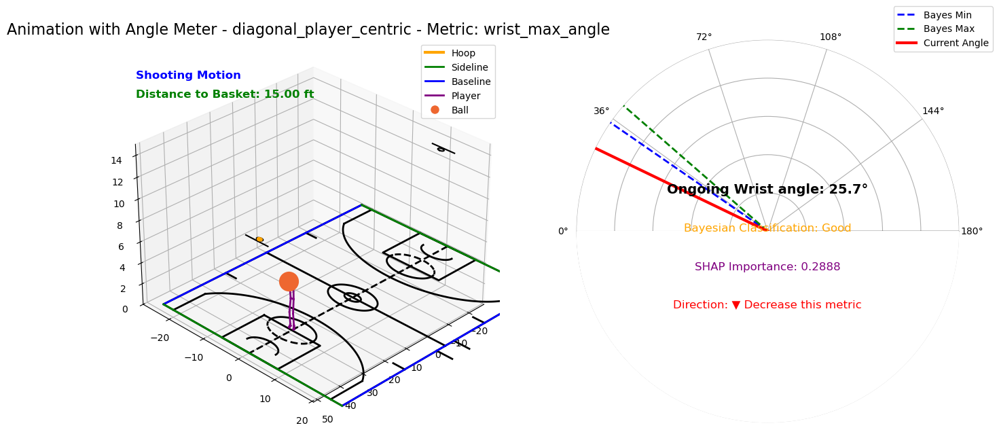

In [5]:
# bayes_animate_from_df_with_bayes_shot_meters.py

import logging
import pandas as pd
import json
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from mplbasketball.court3d import Court3D, draw_court_3d
import matplotlib as mpl

# Increase the animation embed limit to 30 MB
mpl.rcParams['animation.embed_limit'] = 30.0  # Value is in MB

# from bayes_angle_meter import (
#     update_bayes_angle_meter,
#     initialize_bayes_angle_meter
# )
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint

# Configure logging
logger = logging.getLogger('bayes_animate')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)  # Set to DEBUG to capture all logs
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

def initialize_bayes_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def update_bayes_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if release_frame is not None and frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise

def animate_trial_with_bayes_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    frames_to_animate: list = None  # New parameter
) -> HTML:
    """
    Animate a basketball trial with an integrated angle meter using bayesian_metrics_dict.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        # Define default connections if not provided
        if connections is None:
            connections = [
                ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
                ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
                ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
                ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
                ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
                ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
                ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
                ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
                ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
                ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
                ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
                ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
            ]
            if debug:
                logger.debug("Default connections defined for player skeleton.")

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")
            logger.debug(f"Selected metric for angle meter: {selected_metric}")

        # Retrieve elev and azim based on viewpoint_name
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default viewpoint.")
            viewpoint = get_viewpoint("side_view_right")  # Fallback to default
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Using default viewpoint '{viewpoint['name']}': elev={elev}, azim={azim}")

        # Plot setup with predefined viewpoint
        fig = plt.figure(figsize=(16, 8))  # Increased width to accommodate angle meter
        ax_3d = fig.add_subplot(121, projection='3d')  # 3D plot on the left
        ax_3d.view_init(elev=elev, azim=azim)
        ax_3d.set_zlim(0, zlim)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax_3d, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_bayes_elements(
            ax=ax_3d,
            connections=connections,
            player_color=player_color,
            player_lw=player_lw,
            ball_color=ball_color,
            ball_size=ball_size,
            debug=debug
        )

        # Initialize angle meter using bayesian_metrics_dict
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")

        text_offsets = {
            'angle_text_y': 0.6,
            'bayes_classification_text_y': 0.5,
            'shap_importance_text_y': 0.4,
            'shap_direction_text_y': 0.3
        }

        angle_meter_obj = initialize_bayes_angle_meter(
            fig=fig,
            df=df,
            metric=selected_metric,
            bayesian_metrics_dict=bayesian_metrics_dict,
            text_offsets=text_offsets,
            debug=debug
        )

        if debug:
            logger.debug(f"Initialized angle meter for metric '{selected_metric}'.")

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax_3d.set_xlim([x_min, x_max])
        ax_3d.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name and selected metric
        ax_3d.set_title(f"Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric}", fontsize=16)
        if debug:
            logger.debug(f"Set plot title to 'Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric}'")

        # Create custom legend handles for static court features
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # Create handles for dynamic elements
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # Add legend with both static and dynamic elements
        ax_3d.legend(handles=[
            hoop_handle,        # Hoop in orange
            sideline_handle,    # Sideline in green
            baseline_handle,    # Baseline in blue
            player_handle,      # Player skeleton in purple
            ball_handle         # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # Define the update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            # Update 3D elements
            update_bayes_frame(
                ax=ax_3d,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update angle meter for the selected metric
            meter = angle_meter_obj
            if meter:
                update_bayes_angle_meter(
                    ax_meter=meter['ax_meter'],
                    df=df,
                    frame=frame,
                    needle=meter['needle'],
                    angle_text=meter['angle_text'],
                    bayes_classification_text=meter['bayes_classification_text'],
                    shap_importance_text=meter['shap_importance_text'],
                    shap_direction_text=meter['shap_direction_text'],
                    bayesian_metrics_dict=bayesian_metrics_dict,
                    selected_metric=selected_metric,
                    debug=debug
                )
            else:
                if debug:
                    logger.debug("No angle meter initialized for the selected metric.")

            # Update the distance text if available
            if 'distance_to_basket' in df.columns:
                distance = df.at[frame, 'distance_to_basket']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Basket: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Determine frames to use in FuncAnimation
        if frames_to_animate:
            if debug:
                logger.debug(f"Animating {len(frames_to_animate)} shooting_motion frames.")
            frames = frames_to_animate
        else:
            frames = range(len(df))
            if debug:
                logger.debug("Animating all frames.")

        # Create and return animation
        anim = FuncAnimation(fig, update_func, frames=frames, interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim
    except json.JSONDecodeError:
        logger.error("Error")
        raise
def load_bayesian_metrics_dict(
    json_path: str,
    debug: bool = False
) -> dict:
    """
    Load the Bayesian metrics dictionary from a JSON file.

    Parameters:
        json_path (str): Path to the JSON file.
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        dict: Bayesian metrics dictionary.
    """
    try:
        with open(json_path, 'r') as f:
            bayesian_metrics_dict = json.load(f)
        if debug:
            logger.debug(f"Loaded Bayesian metrics dictionary from {json_path}")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))
        return bayesian_metrics_dict
    except FileNotFoundError:
        logger.error(f"Bayesian metrics JSON file not found at {json_path}")
        raise
    except json.JSONDecodeError:
        logger.error(f"JSON decoding failed for file {json_path}")
        raise

# Main execution
if __name__ == "__main__":
    import numpy as np  # Ensure numpy is imported

    # Define paths with placeholders for timestamps
    bayesian_metrics_json_path = "../../data/model/shot_meter_docs/bayesian_metrics_dict.json"
    merged_data_path = "../../data/model/shot_meter_docs/bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv"

    # Load bayesian_metrics_dict
    bayesian_metrics_dict = load_bayesian_metrics_dict(
        json_path=bayesian_metrics_json_path,
        debug=True
    )

    # Load merged_data
    merged_data = pd.read_csv(merged_data_path)

    # Select trial and metric
    selected_trial_id = 'T0089'
    selected_metric = 'wrist_max_angle'  # Example metric

    # Filter data for the selected trial
    trial_data = merged_data[merged_data['trial_id'] == selected_trial_id].sort_values(by='frame_time').reset_index(drop=True)

    # Determine release frame
    release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
    release_frame = release_frames[0] if release_frames else None

    if release_frame is None:
        logger.warning(f"No release frame found for trial_id {selected_trial_id}.")

    # Filter frames where shooting_motion == 1
    shooting_frames = trial_data[trial_data['shooting_motion'] == 1].index.tolist()

    if not shooting_frames:
        logger.warning(f"No shooting_motion frames found for trial_id {selected_trial_id}.")
    else:
        logger.info(f"Number of shooting_motion frames: {len(shooting_frames)}")

    # Ensure release_frame is included in the animation frames
    if release_frame is not None and release_frame not in shooting_frames:
        shooting_frames.append(release_frame)
        logger.info(f"Added release_frame {release_frame} to shooting_frames.")

    # Animate the trial with only shooting_motion frames
    animation_html = animate_trial_with_bayes_angle_meter(
        df=trial_data,
        release_frame=release_frame,
        selected_metric=selected_metric,
        bayesian_metrics_dict=bayesian_metrics_dict,
        viewpoint_name="diagonal_player_centric",
        connections=[
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ],
        zlim=15.0,
        player_color="purple",
        player_lw=2.0,
        ball_color="#ee6730",
        ball_size=20.0,
        highlight_color="red",
        show_court=True,
        court_type="nba",
        units="ft",
        notebook_mode=True,
        debug=True,
        frames_to_animate=shooting_frames  # Pass the filtered frames
    )

    # Display the animation in Jupyter Notebook
    display(animation_html)


In [4]:
import ipywidgets as widgets
from IPython.display import display


# # Slider for animation speed
# speed_slider = widgets.FloatSlider(
#     value=30.0,
#     min=1.0,
#     max=60.0,
#     step=1.0,
#     description='FPS:',
#     continuous_update=False
# )

# # Play/Pause Button
# play_button = widgets.ToggleButton(
#     value=True,
#     description='Pause',
#     disabled=False,
#     button_style='',  # 'success', 'info', 'warning', 'danger' or ''
#     tooltip='Play/Pause Animation',
#     icon='play'  # FontAwesome icon name
# )

# # Function to control animation speed and play/pause
# def control_animation(play, speed):
#     if play:
#         anim.event_source.start()
#         play_button.description = 'Pause'
#         play_button.icon = 'pause'
#     else:
#         anim.event_source.stop()
#         play_button.description = 'Play'
#         play_button.icon = 'play'
#     anim.event_source.interval = 1000 / speed

# play_button.observe(lambda change: control_animation(change['new'], speed_slider.value), names='value')
# speed_slider.observe(lambda change: control_animation(play_button.value, change['new']), names='value')

# # Display controls
# display(play_button, speed_slider)


# Create a dropdown for metric selection
metric_dropdown = widgets.Dropdown(
    options=list(bayesian_metrics_dict.keys()),
    value='release_angle',
    description='Select Metric:',
    disabled=False,
)

# Define a function to update the animation based on selected metric
def update_animation(selected_metric):
    # Clear previous outputs
    plt.close('all')
    
    # Select the trial and metric as before
    selected_trial_id = 'T0089'
    metric_key = selected_metric.lower()
    
    # Fetch trial data
    trial_data = merged_data[merged_data['trial_id'] == selected_trial_id].sort_values(by='frame_time').reset_index(drop=True)
    
    # Determine release frame
    release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
    release_frame = release_frames[0] if release_frames else None
    
    # Animate the trial with the new metric
    animation_html = animate_trial_with_bayes_angle_meter(
        df=trial_data,
        release_frame=release_frame,
        selected_metric=selected_metric,
        bayesian_metrics_dict=bayesian_metrics_dict,
        viewpoint_name="diagonal_player_centric",
        connections=[
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ],
        zlim=15.0,
        player_color="purple",
        player_lw=2.0,
        ball_color="#ee6730",
        ball_size=20.0,
        highlight_color="red",
        show_court=True,
        court_type="nba",
        units="ft",
        notebook_mode=True,
        debug=True
    )
    
    # # Display the animation
    # display(animation_html)

# # Link the dropdown to the update function
# widgets.interact(update_animation, selected_metric=metric_dropdown)


TraitError: Invalid selection: value not found

In [6]:
# bayes_animate_from_df_with_bayes_shot_meters.py

import logging
import pandas as pd
import json
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from mplbasketball.court3d import Court3D, draw_court_3d
import matplotlib as mpl
import base64
import os
import numpy as np  # Ensure numpy is imported

# from bayes_angle_meter import (
#     update_bayes_angle_meter,
#     initialize_bayes_angle_meter
# )
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint

# Increase the animation embed limit to 30 MB
mpl.rcParams['animation.embed_limit'] = 30.0  # Value is in MB

# Configure logging
logger = logging.getLogger('bayes_animate')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)  # Set to DEBUG to capture all logs
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

def initialize_bayes_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def update_bayes_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if release_frame is not None and frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise

def animate_trial_with_bayes_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    # **New Parameters**
    save_path: str = None,               # Path to save the animation externally
    use_html5_video: bool = False,       # Enable compression via HTML5 video
    disable_legend: bool = False         # Disable the legend for optimization
) -> HTML:
    """
    Animate a basketball trial with an integrated angle meter using bayesian_metrics_dict.

    **New Parameters:**
    - save_path: Path to save the animation externally as an MP4 file.
    - use_html5_video: Use HTML5 video encoding for better compression.
    - disable_legend: Disable the legend in the plot to reduce file size.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        # Define default connections if not provided
        if connections is None:
            connections = [
                ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
                ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
                ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
                ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
                ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
                ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
                ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
                ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
                ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
                ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
                ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
                ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
            ]
            if debug:
                logger.debug("Default connections defined for player skeleton.")

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")
            logger.debug(f"Selected metric for angle meter: {selected_metric}")

        # Retrieve elev and azim based on viewpoint_name
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default viewpoint.")
            viewpoint = get_viewpoint("side_view_right")  # Fallback to default
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Using default viewpoint '{viewpoint['name']}': elev={elev}, azim={azim}")

        # Plot setup with predefined viewpoint
        fig, ax = plt.subplots(subplot_kw={'projection': '3d'}, figsize=(14, 8))
        ax.view_init(elev=elev, azim=azim)
        ax.set_zlim(0, zlim)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_bayes_elements(
            ax=ax,
            connections=connections,
            player_color=player_color,
            player_lw=player_lw,
            ball_color=ball_color,
            ball_size=ball_size,
            debug=debug
        )

        # Initialize angle meter using bayesian_metrics_dict
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")

        text_offsets = {
            'max_angle_text_y': 0.3,
            'angle_text_y': 0.35,
            'release_angle_text_y': 0.25
        }

        angle_meter_obj = initialize_bayes_angle_meter(
            fig=fig,
            df=df,
            metric=selected_metric,
            bayesian_metrics_dict=bayesian_metrics_dict,
            text_offsets=text_offsets,
            debug=debug
        )

        if debug:
            logger.debug(f"Initialized angle meter for metric '{selected_metric}'.")

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax.set_xlim([x_min, x_max])
        ax.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name and selected metric
        ax.set_title(f"Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric}", fontsize=16)
        if debug:
            logger.debug(f"Set plot title to 'Animation with Angle Meter - {viewpoint_name} - Metric: {selected_metric}'")

        # Add legend only if disable_legend is False
        if not disable_legend:
            # Create custom legend handles for static court features
            hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
            baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
            sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

            # Create handles for dynamic elements
            player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
            ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                                 markerfacecolor=ball_color, markersize=10)

            # Add legend with both static and dynamic elements (excluding distance)
            ax.legend(handles=[
                hoop_handle,        # Hoop in orange
                sideline_handle,    # Sideline in green
                baseline_handle,    # Baseline in blue
                player_handle,      # Player skeleton in purple
                ball_handle         # Ball in orange
            ], loc='upper right')

            if debug:
                logger.debug("Legend added with static court features and dynamic elements.")
        else:
            # Remove legend if disable_legend is True
            ax.legend().remove()
            if debug:
                logger.debug("Legend removed to optimize animation.")

        # Define the update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            # Update 3D elements
            update_bayes_frame(
                ax=ax,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update angle meter for the selected metric
            meter = angle_meter_obj
            if meter:
                update_bayes_angle_meter(
                    ax_meter=meter['ax_meter'],
                    df=df,
                    frame=frame,
                    needle=meter['needle'],
                    angle_text=meter['angle_text'],
                    max_angle_text=meter['max_angle_text'],
                    release_angle_text=meter['release_angle_text'],
                    bayesian_metrics_dict=bayesian_metrics_dict,
                    selected_metric=selected_metric,
                    debug=debug
                )
            else:
                if debug:
                    logger.debug("No angle meter initialized for the selected metric.")

            # Update the distance text if available
            if 'distance_to_basket' in df.columns:
                distance = df.at[frame, 'distance_to_basket']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Basket: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Create the animation
        anim = FuncAnimation(fig, update_func, frames=len(df), interval=1000 / 30, blit=False)

        # Handle saving the animation if save_path is provided
        if save_path:
            try:
                # Determine writer based on file extension
                if save_path.endswith('.mp4'):
                    writer = 'ffmpeg'
                elif save_path.endswith('.gif'):
                    writer = 'imagemagick'
                else:
                    raise ValueError("Unsupported file format. Use .gif or .mp4.")
                
                # Save the animation
                anim.save(save_path, writer=writer, dpi=80)

                logger.debug(f"Animation saved to {save_path} using writer '{writer}'.")
            except Exception as e:
                logger.error(f"Error saving animation to {save_path}: {e}")
                raise

        # Handle HTML5 video compression if use_html5_video is True
        if use_html5_video:
            try:
                # Configure the FFMpeg writer with compression settings
                Writer = mpl.animation.FFMpegWriter
                writer = Writer(fps=30, metadata=dict(artist='Me'), bitrate=1800)
                
                # Save the animation to a temporary MP4 file
                temp_save_path = "temp_animation.mp4"
                anim.save(temp_save_path, writer=writer, dpi=80)

                # Read and encode the video in base64
                with open(temp_save_path, "rb") as video_file:
                    video_data = video_file.read()
                video_b64 = base64.b64encode(video_data).decode('utf-8')
                
                # Remove the temporary file
                os.remove(temp_save_path)

                # Embed the video using HTML5
                video_html = f'''
                <video controls loop>
                    <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
                    Your browser does not support the video tag.
                </video>
                '''
                logger.debug("Animation compressed using HTML5 video encoding.")
                return HTML(video_html)
            except Exception as e:
                logger.error(f"Error during HTML5 video encoding: {e}")
                # Fallback to JSHTML if encoding fails
                logger.debug("Falling back to JSHTML encoding.")
                return HTML(anim.to_jshtml())
        else:
            # Default embedding using JSHTML or return the animation object
            if notebook_mode:
                logger.debug("Returning animation for notebook display using JSHTML.")
                return HTML(anim.to_jshtml())
            else:
                logger.debug("Returning animation object.")
                return anim
    except Exception as e:
        logger.error(f"Error loading and optimizing data: {e}")
        raise
    
def load_bayesian_metrics_dict(
    json_path: str,
    debug: bool = False
) -> dict:
    """
    Load the Bayesian metrics dictionary from a JSON file.

    Parameters:
        json_path (str): Path to the JSON file.
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        dict: Bayesian metrics dictionary.
    """
    try:
        with open(json_path, 'r') as f:
            bayesian_metrics_dict = json.load(f)
        if debug:
            logger.debug(f"Loaded Bayesian metrics dictionary from {json_path}")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))
        return bayesian_metrics_dict
    except FileNotFoundError:
        logger.error(f"Bayesian metrics JSON file not found at {json_path}")
        raise
    except json.JSONDecodeError:
        logger.error(f"JSON decoding failed for file {json_path}")
        raise

def load_and_optimize_data(merged_data_path: str, debug: bool = False) -> pd.DataFrame:
    """
    Load and optimize the merged data to reduce memory usage.
    
    Parameters:
        merged_data_path (str): Path to the merged CSV data.
        debug (bool): Whether to print debug information.
    
    Returns:
        pd.DataFrame: Optimized DataFrame.
    """
    try:
        # Read a sample to determine columns
        sample_df = pd.read_csv(merged_data_path, nrows=100)
        dtype_dict = {}
        for col in sample_df.columns:
            if col.endswith('_x') or col.endswith('_y') or col.endswith('_z'):
                dtype_dict[col] = 'float32'
            elif col == 'trial_id':
                dtype_dict[col] = 'category'
            elif 'shap_recommendation' in col:
                dtype_dict[col] = 'object'  # Exclude from float conversion
            else:
                # Attempt to set other columns to float32, handle exceptions
                dtype_dict[col] = 'float32'  # Adjust as necessary

        # Load the full dataset with optimized dtypes
        merged_data = pd.read_csv(merged_data_path, dtype=dtype_dict)
        
        if debug:
            logger.debug("Loaded and optimized merged data types.")
            logger.debug(merged_data.dtypes)
        
        # Convert object columns to numeric where possible
        object_columns = merged_data.select_dtypes(include=['object']).columns
        for col in object_columns:
            merged_data[col] = pd.to_numeric(merged_data[col], errors='coerce')
            if debug:
                num_converted = merged_data[col].isnull().sum()
                logger.debug(f"Converted column '{col}' to numeric with {num_converted} NaN values.")

        return merged_data
    except Exception as e:
        logger.error(f"Error loading and optimizing data: {e}")
        raise

def initialize_bayes_angle_meter(
    fig: plt.Figure,
    df: pd.DataFrame,
    metric: str,
    bayesian_metrics_dict: dict,
    text_offsets: dict,
    debug: bool = False
) -> dict:
    """
    Initialize the Bayesian angle meter.

    Parameters:
        fig (plt.Figure): The figure object.
        df (pd.DataFrame): The DataFrame containing data.
        metric (str): The selected metric.
        bayesian_metrics_dict (dict): Dictionary containing Bayesian metrics.
        text_offsets (dict): Dictionary containing text positions.
        debug (bool): Whether to print debug information.

    Returns:
        dict: Dictionary containing angle meter components.
    """
    # Placeholder implementation
    # Replace with actual initialization code
    # For demonstration, returning an empty dictionary
    if debug:
        logger.debug("Initializing Bayesian angle meter.")
    return {}

def update_bayes_angle_meter(
    ax_meter: plt.Axes,
    df: pd.DataFrame,
    frame: int,
    needle: plt.Line2D,
    angle_text: plt.Text,
    max_angle_text: plt.Text,
    release_angle_text: plt.Text,
    bayesian_metrics_dict: dict,
    selected_metric: str,
    debug: bool = False
) -> None:
    """
    Update function for the Bayesian angle meter.

    Parameters:
        ax_meter (plt.Axes): The axes for the angle meter.
        df (pd.DataFrame): The DataFrame containing data.
        frame (int): The current frame index.
        needle (plt.Line2D): The needle line.
        angle_text (plt.Text): The text displaying current angle.
        max_angle_text (plt.Text): The text displaying maximum angle.
        release_angle_text (plt.Text): The text displaying release angle range.
        bayesian_metrics_dict (dict): Dictionary containing Bayesian metrics.
        selected_metric (str): The selected metric.
        debug (bool): Whether to print debug information.

    Returns:
        None
    """
    # Placeholder implementation
    # Replace with actual update code
    # For demonstration, updating angle_text with dummy data
    if debug:
        logger.debug(f"Updating Bayesian angle meter for frame {frame}.")
    if 'release_angle' in df.columns:
        current_angle = df.at[frame, 'release_angle']
        angle_text.set_text(f"Current Angle: {current_angle:.2f}°")
    # Add more update logic as needed

# Main execution
if __name__ == "__main__":
    # Define paths with placeholders for timestamps
    bayesian_metrics_json_path = "../../data/model/shot_meter_docs/bayesian_metrics_dict.json"
    merged_data_path = "../../data/model/shot_meter_docs/bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv"

    # Load bayesian_metrics_dict
    bayesian_metrics_dict = load_bayesian_metrics_dict(
        json_path=bayesian_metrics_json_path,
        debug=True
    )

    # Load merged_data with optimization if enabled
    # For this example, assume 'optimize_data' is True
    optimize_data_flag = True  # Set based on your needs
    if optimize_data_flag:
        merged_data = load_and_optimize_data(merged_data_path, debug=True)
    else:
        merged_data = pd.read_csv(merged_data_path)
        if logger.isEnabledFor(logging.DEBUG):
            logger.debug("Loaded merged data without optimization.")

    # Select trial and metric
    selected_trial_id = 'T0089'
    selected_metric = 'release_angle'  # Example metric

    # Filter data for the selected trial
    trial_data = merged_data[merged_data['trial_id'] == selected_trial_id].sort_values(by='frame_time').reset_index(drop=True)

    # Determine release frame
    release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
    release_frame = release_frames[0] if release_frames else None

    if release_frame is None:
        logger.warning(f"No release frame found for trial_id {selected_trial_id}.")
 
    # Animate the trial with optimizations
    animation_html = animate_trial_with_bayes_angle_meter(
        df=trial_data,
        release_frame=release_frame,
        selected_metric=selected_metric,
        bayesian_metrics_dict=bayesian_metrics_dict,
        viewpoint_name="diagonal_player_centric",
        connections=[
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ],
        zlim=15.0,
        player_color="purple",
        player_lw=2.0,
        ball_color="#ee6730",
        ball_size=20.0,
        highlight_color="red",
        show_court=True,
        court_type="nba",
        units="ft",
        notebook_mode=True,
        debug=True,
        # **New Optimization Parameters**
        save_path='animation.mp4',           # Save the animation as MP4
        use_html5_video=True,                # Enable HTML5 video compression
        disable_legend=True                  # Disable the legend to optimize animation
    )

    # Display the animation in Jupyter Notebook
    display(animation_html)


2024-12-12 14:39:28,508 - DEBUG - Loaded Bayesian metrics dictionary from ../../data/model/shot_meter_docs/bayesian_metrics_dict.json
2024-12-12 14:39:28,509 - DEBUG - {
    "knee_max_angle": {
        "min": 66.03607822127846,
        "max": 66.53271533316733,
        "optimal": 66.53271533316733,
        "original": 63.5410068390672,
        "bayes_classification": "Early",
        "shap_recommendation": "60.6\u201363.5",
        "shap_importance": 0.0498,
        "filter_name": "knee_angle",
        "shap_min": 60.6,
        "shap_max": 63.5,
        "shap_direction": "positive"
    },
    "wrist_max_angle": {
        "min": 31.425878434541,
        "max": 32.229224183839385,
        "optimal": 31.425878434541,
        "original": 35.91840619355692,
        "bayes_classification": "Late",
        "shap_recommendation": "36.0\u201340.4",
        "shap_importance": 0.2084,
        "filter_name": "wrist_angle",
        "shap_min": 36.0,
        "shap_max": 40.4,
        "shap_direction

ValueError: could not convert string to float: 'positive'